# Prepare metabolomics data for time course clustering
This notebook is dedicated to preparing the VBCF metabolomics facility results for time course clustering. However, since the data is provided as excel file containing several sheets one needs to do some preprocessing in excel in order to make the data parsable. In particular these preprocessing/reformating steps apply only to the 'Results HILIC' and 'Results RP' sheets since these are the main data sources.

1. Reformat the log2 fold change cells to contain numbers with at least 3 decimal places
2. Reformat the normalized peak area cells to contain numbers with at least 10 decimal places
3. Reformat the adjusted p-values cells to contain numbers with at least 20 decimal places
3. Save each sheet as UTF-8 decoded CSV file

The rest will be done by `parse_metabolomics_results` function which will return two `pandas.DataFrame` objects containing all the data you need (one containing everything that has a KEGG ID and one containing everything without a KEGG ID). Of course one could have also used the `read_excel` function of pandas but this provided less felxibility which was needed to parse the data.

## Data parsing and initial visualization

In [4]:
# define some functions for data ingestion
import pandas as pd
import csv
import requests
from thefuzz import fuzz
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

def get_unambiguous_column_names(column_names):
    series = pd.Series(column_names)
    series[series.duplicated(keep = 'first')] = series[series.duplicated(keep = 'first')].apply(
        lambda x: x + '.1'
    )
    return series.to_list()

def parse_metabolomics_results(filename, delimiter = ',', quotechar = '"'):
    with open(filename) as csvfile:
        data = []
        entryid = None
        csvreader = csv.reader(
            csvfile,
            delimiter = delimiter,
            quotechar = quotechar
        )
        
        # get column names and make them unambiguous
        names = []
        for i in range(2):
            names = csvreader.__next__()
        
        names = get_unambiguous_column_names(names)
        
        add_names = [
                'Name2', 
                'Molecular Weight', 
                'RT [min]2', 
                'DeltaMass [ppm]', 
                'DBID', 
                'Reference List Name', 
                'mzLogic Score', 
                'ChemSpider ID', 
                'KEGG', 'HMDB', 
                'Mass List Search Results ID'
        ]
        add_names_set = set([k if not k in {'Name2', 'RT [min]2'} else k[:-1] for k in add_names]) # faster check
        series = None
        tmp_names = []
        add_rows = []
        
        def insert_addrow_into_series(series, names, values, add_names_set):
            series = series.copy()
            for k, v in zip(names, values):
                if k in add_names_set:
                    k = k + '2' if k in {'Name', 'RT [min]'} else k
                    series[k] = v if v else None

                elif k == 'KEGG ID':
                    series['KEGG'] = v if v else None
            
            return series
            
        for line in csvreader:
            if line[0]:
                if add_rows:
                    exact_match = False
                    partial_match = False
                    for row in add_rows:
                        if row[0] == series.Name:
                            data.append(
                                insert_addrow_into_series(
                                    series,
                                    tmp_names,
                                    row,
                                    add_names_set
                                )
                            )
                            exact_match = True
                            break
                    
                    if not exact_match:
                        for row in add_rows:
                            if fuzz.partial_ratio(row[0].lower(), series.Name.lower()) > 95:
                                data.append(
                                    insert_addrow_into_series(
                                        series,
                                        tmp_names,
                                        row,
                                        add_names_set
                                    )
                                )
                                partial_match = True
                                break
                    
                    if not partial_match:
                        data.append(series.copy())
                
                elif isinstance(series, pd.Series):
                    data.append(series.copy())
                    
                entryid = line[0]
                add_rows = []
                series = pd.Series(
                    {k: v for k, v in zip(names, line)}
                )
                
            elif line[1] == 'Name':
                tmp_names = [name for name in line if name]
            
            else:
                add_rows.append(line[1: 1 + len(tmp_names)])
    
    return pd.DataFrame(data, columns = names + add_names)

def clean_dataframe(df):
    no_kegg_rows = df.KEGG.isna()
    no_kegg = df.loc[no_kegg_rows, :].copy()
    kegg = df.loc[~no_kegg_rows, :].copy()
    for df in [kegg, no_kegg]:
        df.drop_duplicates(
            subset = ['ID', 'KEGG'],
            inplace = True
        )
    
    no_kegg = no_kegg.loc[~no_kegg.ID.isin(kegg.ID), :]
    return kegg, no_kegg

In [5]:
# ingest hilic results and print total shape for comparison with cleaned data (aka only compounds with KEGG ids remain)
hilic = parse_metabolomics_results('../raw/Results_Untargeted_Metabolomics_E14-P40_LK_Nova_results_HILIC.csv')
print(hilic.ID.unique().shape)
hilic, no_kegg_hilic = clean_dataframe(hilic)
hilic

(395,)


,ID,Name,Calc. MW,RT [min],"(P40, KO) / (P40, WT)","(P2, KO) / (P2, WT)","(E14_5, KO) / (E14_5, WT)","(P40, WT) / (P2, WT)","(P40, WT) / (E14_5, WT)","(P2, WT) / (E14_5, WT)",...,Molecular Weight,RT [min]2,DeltaMass [ppm],DBID,Reference List Name,mzLogic Score,ChemSpider ID,KEGG,HMDB,Mass List Search Results ID
0,A001_HILIC,Pyruvic acid,88.0160,3.93,-1.320000000000000,-0.310000000000000,-0.550000000000000,0.030000000000000,-0.270000000000000,-0.300000000000000,...,88.0160,3.71,-0.111834801713597,B003,iHILIC_neg_2020,68.351931981663100,1031,C00022,HMDB0000243,101
2,A002_HILIC,L-(+)-Alanine,89.0477,14.83,0.000000000000000,-0.050000000000000,-0.040000000000000,0.230000000000000,-0.340000000000000,-0.570000000000000,...,89.0477,14.80,0.344160806154653,A072,iHILIC_neg_2020,74.927524987884600,5735,C00041,HMDB0000161,57
4,A003_HILIC,Sarcosine,89.0477,13.63,0.310000000000000,0.040000000000000,0.220000000000000,-4.070000000000000,-4.170000000000000,-0.090000000000000,...,89.0477,13.67,0.710353320714767,A026,iHILIC_pos_2020,36.310735718267000,1057,C00213,HMDB0000271,26
6,A004_HILIC,L-(+)-Lactic acid,90.0317,4.48,1.080000000000000,0.210000000000000,-0.220000000000000,-0.280000000000000,-0.780000000000000,-0.490000000000000,...,90.0317,4.76,-0.104460588745218,B002,iHILIC_neg_2020,93.199821132516900,96860,C00186,HMDB0000190,109
8,A005_HILIC,Glycerin,92.0474,7.10,0.210000000000000,-0.060000000000000,-0.200000000000000,1.640000000000000,1.580000000000000,-0.060000000000000,...,92.0473,7.10,0.166500390623766,D034,iHILIC_neg_2020,None,733,C00116,HMDB0000131,473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348,B180_HILIC,"α,α-Trehalose",342.1162,15.63,1.900000000000000,0.600000000000000,0.070000000000000,-0.950000000000000,-3.740000000000000,-2.790000000000000,...,342.1162,NaN,-0.19,NaN,NaN,NaN,NaN,C01083,NaN,NaN
354,B183_HILIC,Uridine 5'-diphosphate (UDP),404.0022,18.51,-0.030000000000000,-0.040000000000000,-0.030000000000000,-2.590000000000000,-5.550000000000000,-2.960000000000000,...,404.0022,NaN,0.03,NaN,NaN,NaN,NaN,C00015,NaN,NaN
356,B184_HILIC,Adenosine diphosphate (ADP),427.0296,17.32,-0.170000000000000,-0.190000000000000,-0.040000000000000,-0.580000000000000,-2.300000000000000,-1.720000000000000,...,427.0294,NaN,0.31,NaN,NaN,NaN,NaN,C00008,NaN,NaN
360,B186_HILIC,Uridine 5'-diphosphoglucuronic acid,580.0345,20.93,0.120000000000000,-0.190000000000000,0.010000000000000,-1.590000000000000,-2.120000000000000,-0.540000000000000,...,580.0343,NaN,0.28,NaN,NaN,NaN,NaN,C00167,NaN,NaN


In [6]:
no_kegg_hilic

,ID,Name,Calc. MW,RT [min],"(P40, KO) / (P40, WT)","(P2, KO) / (P2, WT)","(E14_5, KO) / (E14_5, WT)","(P40, WT) / (P2, WT)","(P40, WT) / (E14_5, WT)","(P2, WT) / (E14_5, WT)",...,Molecular Weight,RT [min]2,DeltaMass [ppm],DBID,Reference List Name,mzLogic Score,ChemSpider ID,KEGG,HMDB,Mass List Search Results ID
62,A032_HILIC,6-Methylnicotinamide,136.0638,23.31,-0.190000000000000,-0.150000000000000,-0.200000000000000,1.010000000000000,0.520000000000000,-0.480000000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63,A033_HILIC,6-Oxo-pipecolinic acid,143.0583,3.85,0.160000000000000,0.770000000000000,-0.190000000000000,-1.590000000000000,-4.090000000000000,-2.500000000000000,...,143.0582,4.10,0.483835427817555,A111,iHILIC_neg_2020,39.463764977710500,2282737,None,HMDB0061705,578
219,A112_HILIC,PC,757.5617,2.83,0.460000000000000,0.080000000000000,-0.040000000000000,-1.830000000000000,-2.740000000000000,-0.910000000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
224,B115_HILIC,3-Oxopropanoic acid,88.0160,3.29,-1.170000000000000,-0.100000000000000,-0.440000000000000,0.150000000000000,-0.350000000000000,-0.500000000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
227,B117_HILIC,3-(METHYLNITROSAMINO)PROPIONITRILE,113.0590,15.00,0.300000000000000,0.040000000000000,-0.480000000000000,1.340000000000000,1.220000000000000,-0.110000000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
758,c391_HILIC,PS(16:0/16:1(9Z)),733.4894,2.14,0.130000000000000,0.140000000000000,-0.330000000000000,-0.670000000000000,-3.810000000000000,-3.140000000000000,...,733.4894,NaN,0.05,NaN,NaN,None,NaN,NaN,NaN,NaN
760,c392_HILIC,PS(16:1(9Z)/18:1(9Z)),759.5050,2.13,0.630000000000000,0.140000000000000,-0.180000000000000,-0.810000000000000,-3.470000000000000,-2.660000000000000,...,759.5050,NaN,0.01,NaN,NaN,None,NaN,NaN,NaN,NaN
762,c393_HILIC,"PS(18:2(9Z,12Z)/18:2(9Z,12Z))",783.5051,2.12,0.780000000000000,0.100000000000000,-0.090000000000000,-2.190000000000000,-3.060000000000000,-0.870000000000000,...,783.5050,NaN,0.02,NaN,NaN,None,NaN,NaN,NaN,NaN
764,c394_HILIC,Phosphatidylserine,791.5676,1.98,0.950000000000000,0.840000000000000,-0.630000000000000,1.500000000000000,-1.480000000000000,-2.980000000000000,...,791.5676,NaN,-0.09,NaN,NaN,None,NaN,NaN,NaN,NaN


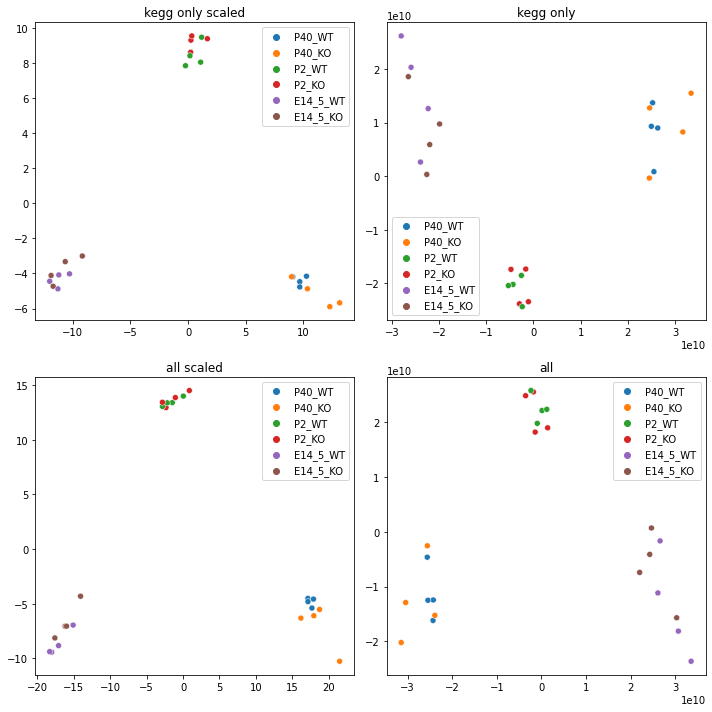

In [7]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components = 2)
scaler = StandardScaler()
fig, axs = plt.subplots(2, 2)
for i, key, data in zip(
    range(2),
    ['kegg only', 'all'],
    [
        hilic.loc[:, hilic.columns[hilic.columns.str.startswith('S')]].T,
        pd.concat([hilic, no_kegg_hilic]).loc[:, hilic.columns[hilic.columns.str.startswith('S')]].T
    ]
):
    
    for scaled, ax in zip([True, False], axs[i, :]):
        if scaled:
            title = key + ' scaled'
            transform = pca.fit_transform(
                scaler.fit_transform(data.values)
            )
        else:
            title = key
            transform = pca.fit_transform(
                data.values
            )
            
        sns.scatterplot(
            x = transform[:, 0],
            y = transform[:, 1],
            hue = [i[4:-1] for i in data.index.to_list()],
            ax = ax
        )
        
        ax.set_title(title)

fig.set_figheight(10)
fig.set_figwidth(10)
fig.tight_layout()

In [8]:
# ingestion for rp results which are not yet used in the workflow
# since I didn't find a way to combine with hilic
rp = parse_metabolomics_results('../raw/Results_Untargeted_Metabolomics_E14-P40_LK_Nova_results_RP.csv')
print(rp.ID.unique().shape)
rp, no_kegg_rp = clean_dataframe(rp)
rp

(212,)


,ID,Name,Calc. MW,RT [min],"(P40, KO) / (P40, WT)","(P2, KO) / (P2, WT)","(E14_5, KO) / (E14_5, WT)","(P40, WT) / (P2, WT)","(P40, WT) / (E14_5, WT)","(P2, WT) / (E14_5, WT)",...,Molecular Weight,RT [min]2,DeltaMass [ppm],DBID,Reference List Name,mzLogic Score,ChemSpider ID,KEGG,HMDB,Mass List Search Results ID
0,A001_RP,L-(+)-Alanine,89.0478,3.86,0.100000000000000,0.140000000000000,0.210000000000000,0.150000000000000,-1.900000000000000,-2.050000000000000,...,89.0477,3.86,1.085923914713660,A072,RP_pos_2020,93.425071124000300,5735,C00041,HMDB0000161,71
2,A002_RP,L-a-Amino-n-butyric acid,103.0633,4.05,0.480000000000000,0.460000000000000,-0.180000000000000,1.730000000000000,3.060000000000000,1.330000000000000,...,103.0633,4.36,-0.173095240100695,E19,RP_pos_2020,89.904927785489700,72524,C02356,HMDB0000452,176
4,A003_RP,Choline,103.0997,3.82,0.080000000000000,0.270000000000000,0.060000000000000,0.550000000000000,0.170000000000000,-0.380000000000000,...,103.0997,3.88,-0.154611546026531,B018,RP_pos_2020,None,299,C00114,HMDB0000097,72
6,A004_RP,L-Serine,105.0426,3.74,-0.080000000000000,0.500000000000000,0.180000000000000,0.580000000000000,0.050000000000000,-0.530000000000000,...,105.0426,3.74,0.353302327603140,A075,RP_neg_2020,91.032025486249400,5736,C00065,HMDB0000187,19
8,A005_RP,Hypotaurine,109.0198,3.86,0.180000000000000,0.480000000000000,0.390000000000000,-2.540000000000000,-4.310000000000000,-1.770000000000000,...,109.0198,3.88,0.681524431027504,B019,RP_pos_2020,70.956674196698300,96959,C00519,HMDB0000965,75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,B103_RP,Uridine monophosphate (UMP),324.0360,5.45,-0.130000000000000,0.170000000000000,-0.010000000000000,-1.490000000000000,0.010000000000000,1.500000000000000,...,324.0359,NaN,0.35,NaN,NaN,NaN,NaN,C00105,NaN,NaN
204,B104_RP,3'-Adenosine monophosphate (3'-AMP),347.0631,6.04,-0.070000000000000,0.090000000000000,0.050000000000000,0.750000000000000,1.740000000000000,0.990000000000000,...,347.0631,NaN,0.10,NaN,NaN,NaN,NaN,C01367,NaN,NaN
206,B105_RP,4-Hydroxytamoxifen,387.2198,26.07,0.070000000000000,1.940000000000000,-0.010000000000000,-5.140000000000000,-0.560000000000000,4.580000000000000,...,387.2198,NaN,-0.09,NaN,NaN,NaN,NaN,D06551,NaN,NaN
210,B107_RP,Adenosine diphosphate (ADP),427.0298,4.74,-0.110000000000000,-0.160000000000000,-0.070000000000000,-0.750000000000000,-3.170000000000000,-2.420000000000000,...,427.0294,NaN,0.78,NaN,NaN,NaN,NaN,C00008,NaN,NaN


In [9]:
no_kegg_rp

,ID,Name,Calc. MW,RT [min],"(P40, KO) / (P40, WT)","(P2, KO) / (P2, WT)","(E14_5, KO) / (E14_5, WT)","(P40, WT) / (P2, WT)","(P40, WT) / (E14_5, WT)","(P2, WT) / (E14_5, WT)",...,Molecular Weight,RT [min]2,DeltaMass [ppm],DBID,Reference List Name,mzLogic Score,ChemSpider ID,KEGG,HMDB,Mass List Search Results ID
130,A066_RP,Stearoyl-L-carnitine,427.3664,28.56,1.140000000000000,0.320000000000000,-0.050000000000000,0.110000000000000,-1.040000000000000,-1.150000000000000,...,427.3662,28.33,0.602816593435716,B039,RP_neg_2020,None,4932275,None,HMDB0000848,169
134,A068_RP,1-Oleoyl-2-hydroxy-sn-glycero-3-PE,479.3015,30.93,0.500000000000000,0.060000000000000,-0.130000000000000,0.170000000000000,0.630000000000000,0.460000000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
155,B079_RP,3-Hydroxybutyric acid,104.0474,11.06,0.950000000000000,-0.010000000000000,-0.730000000000000,-2.430000000000000,-3.740000000000000,-1.310000000000000,...,104.0473,NaN,0.75,NaN,NaN,NaN,NaN,None,NaN,NaN
165,B084_RP,g-Butyrobetaine,145.1103,4.57,-0.160000000000000,-0.450000000000000,-0.260000000000000,0.210000000000000,1.660000000000000,1.450000000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
172,B088_RP,Isophthalic acid,166.0267,17.29,1.110000000000000,0.470000000000000,-0.110000000000000,-0.070000000000000,-1.960000000000000,-1.890000000000000,...,166.0266,NaN,0.37,NaN,NaN,NaN,NaN,None,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407,c208_RP,"9,12-Hexadecadienoylcarnitine",395.3041,26.49,-0.090000000000000,-0.890000000000000,-0.250000000000000,-1.010000000000000,-2.130000000000000,-1.120000000000000,...,395.3036,NaN,1.34,NaN,NaN,None,NaN,NaN,NaN,NaN
409,c209_RP,Solasodine,413.3295,21.37,-0.120000000000000,0.370000000000000,-0.490000000000000,4.830000000000000,1.370000000000000,-3.460000000000000,...,413.3294,NaN,0.34,NaN,NaN,None,NaN,NaN,NaN,NaN
411,c210_RP,Inspra,414.2044,27.78,0.640000000000000,0.190000000000000,-0.110000000000000,-0.010000000000000,-1.670000000000000,-1.650000000000000,...,414.2042,NaN,0.35,NaN,NaN,None,NaN,NaN,NaN,NaN
413,c211_RP,2-Aminoethyl (2R)-3-[(1Z)-1-hexadecen-1-yloxy]...,437.2909,31.20,0.940000000000000,0.560000000000000,-0.130000000000000,0.560000000000000,-0.850000000000000,-1.410000000000000,...,437.2906,NaN,0.52,NaN,NaN,None,NaN,NaN,NaN,NaN


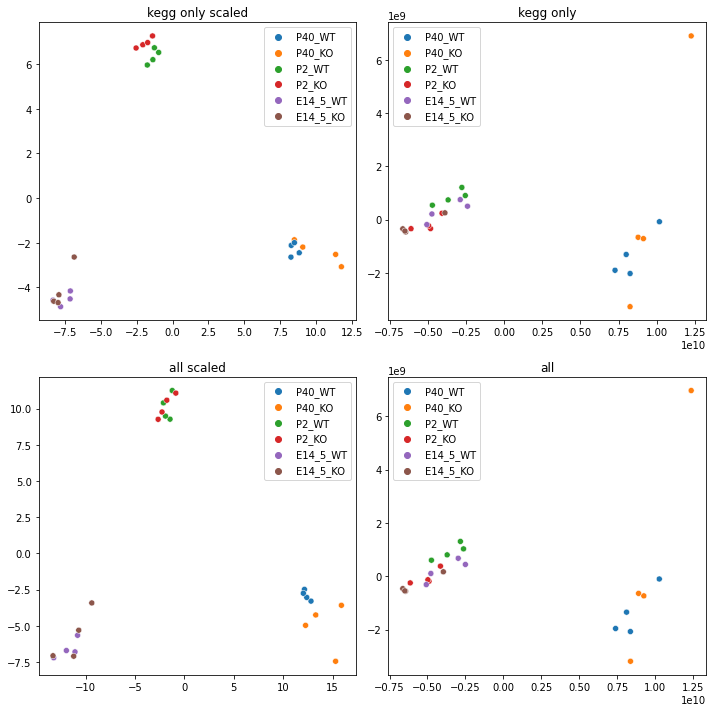

In [10]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components = 2)
scaler = StandardScaler()
fig, axs = plt.subplots(2, 2)
for i, key, data in zip(
    range(2),
    ['kegg only', 'all'],
    [
        rp.loc[:, rp.columns[rp.columns.str.startswith('S')]].T,
        pd.concat([rp, no_kegg_rp]).loc[:, rp.columns[rp.columns.str.startswith('S')]].T
    ]
):
    
    for scaled, ax in zip([True, False], axs[i, :]):
        if scaled:
            title = key + ' scaled'
            transform = pca.fit_transform(
                scaler.fit_transform(data.values)
            )
        else:
            title = key
            transform = pca.fit_transform(
                data.values
            )
            
        sns.scatterplot(
            x = transform[:, 0],
            y = transform[:, 1],
            hue = [i[4:-1] for i in data.index.to_list()],
            ax = ax
        )
        
        ax.set_title(title)

fig.set_figheight(10)
fig.set_figwidth(10)
fig.tight_layout()

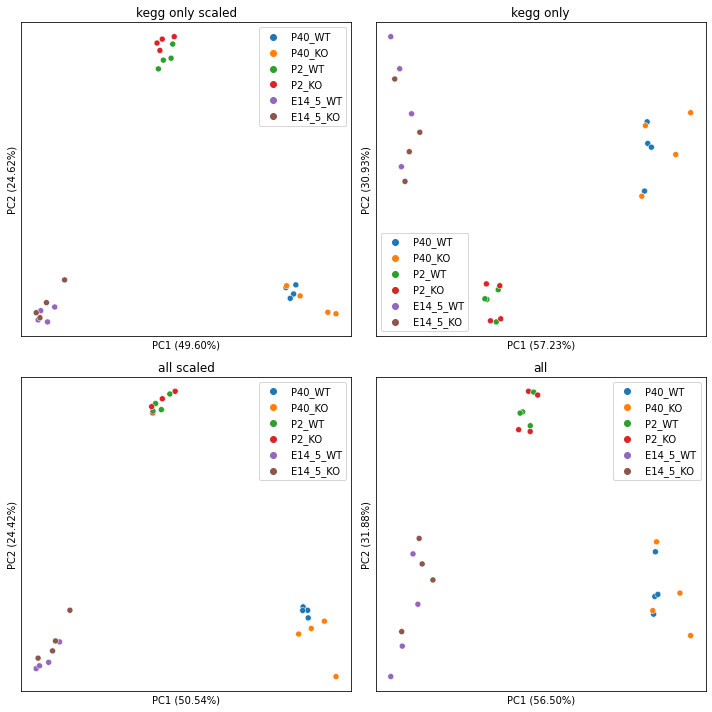

In [11]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components = 2)
scaler = StandardScaler()
fig, axs = plt.subplots(2, 2)
kegg_df = pd.concat([rp, hilic])
no_kegg_df = pd.concat([no_kegg_rp, no_kegg_hilic])
for i, key, data in zip(
    range(2),
    ['kegg only', 'all'],
    [
        kegg_df.loc[:, kegg_df.columns[kegg_df.columns.str.startswith('S')]].T,
        pd.concat([kegg_df, no_kegg_df]).loc[:, kegg_df.columns[kegg_df.columns.str.startswith('S')]].T
    ]
):
    
    for scaled, ax in zip([True, False], axs[i, :]):
        if scaled:
            title = key + ' scaled'
            transform = pca.fit_transform(
                scaler.fit_transform(data.values)
            )
        else:
            title = key
            transform = pca.fit_transform(
                data.values
            )
        
        sns.scatterplot(
            x = transform[:, 0],
            y = transform[:, 1],
            hue = [i[4:-1] for i in data.index.to_list()],
            ax = ax
        )
        
        ax.set_title(title)
        ax.set_ylabel(
            'PC2 ({:.2f}%)'.format(pca.explained_variance_ratio_[1] * 100)
        )
        ax.set_xlabel(
            'PC1 ({:.2f}%)'.format(pca.explained_variance_ratio_[0] * 100)
        )
        ax.set_xticks([])
        ax.set_yticks([])

fig.set_figheight(10)
fig.set_figwidth(10)
fig.tight_layout()

In [12]:
# combine hilic and rp in two different ways
def get_clean_coarse_group(x):
    x = x.split('/')[0].strip().lower()
    if x.startswith('bio'):
        x = 'bioenergetic process'
        
    elif x.startswith('nucleoside'):
        x = 'nucleoside metabolism'
    
    elif x.startswith('glycolysis'):
        x = 'glycolysis'
    
    elif x.startswith('lipid'):
        x = 'lipid metablism'
    
    elif x.startswith('purine'):
        x = 'nucleoside metabolism'
        
    elif x.startswith('aa'):
        x = 'aa metabolism'
        
    else:
        x = 'other'
        
    return x

basedata = {}
for key in ['RP', 'HILIC']:
    base = pd.read_csv(
        f'../raw/untargeted_Metabo_Results_LKnaus_annotated_DM_clean_annot_{key}.csv',
        header = 1
    ).loc[:, ['ID', 'Name Metabolite ', 'Group ']]
    base.columns = ['ID', 'metabolitename', 'metabolitegroupfine']
    base['metabolitegroupcoarse'] = base.metabolitegroupfine.apply(
        get_clean_coarse_group
    )

    frames = []
    for df in [hilic, no_kegg_hilic, rp, no_kegg_rp]:
        frames.append(
            base.merge(
                df,
                on = 'ID',
                how = 'inner'
            )
        )
    
    basedata[key] = pd.concat(frames).reset_index(drop = True)
    
basedata

{'RP':              ID                                     metabolitename  \
 0    A024_HILIC                                 N-Acetylputrescine   
 1    A007_HILIC                     gamma-Aminobutyric acid (GABA)   
 2    A006_HILIC                                N,N-Dimethylglycine   
 3    A003_HILIC                                          Sarcosine   
 4    B121_HILIC                                Aminolevulinic acid   
 ..          ...                                                ...   
 336     C165_RP  lysophosphatidylethanolamine (22:6(4Z,7Z,10Z,1...   
 337     C116_RP                              Phosphoryethanolamine   
 338     C114_RP                                     Dihydrothymine   
 339     C155_RP                             uridine 5′-diphosphate   
 340     B109_RP                       Adenosine diphosphate ribose   
 
                                    metabolitegroupfine  metabolitegroupcoarse  \
 0    AA Metabolism / Arginine / Spermidine / Polyam...   

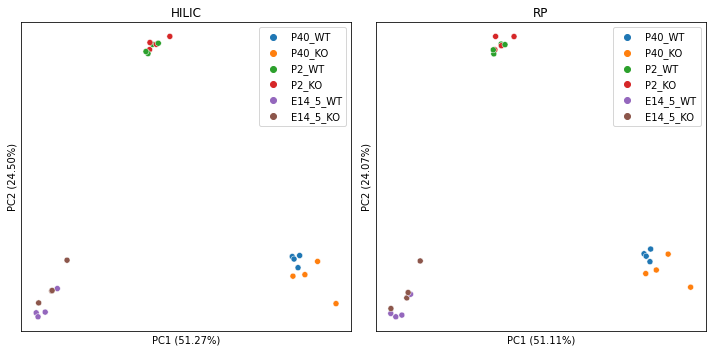

In [13]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

pca = PCA(n_components = 2)
scaler = StandardScaler()
fig, axs = plt.subplots(1, 2)
for i, key in enumerate(['HILIC', 'RP']):
    title = key
    ax = axs[i]
    data = basedata[key]
    data = data.loc[:, data.columns[data.columns.str.startswith('S')]].T 
    transform = pca.fit_transform(
        scaler.fit_transform(
            data.values
        )
    )

    sns.scatterplot(
        x = transform[:, 0],
        y = transform[:, 1],
        hue = [i[4:-1] for i in data.index.to_list()],
        ax = ax
    )

    ax.set_title(title)
    ax.set_ylabel(
        'PC2 ({:.2f}%)'.format(pca.explained_variance_ratio_[1] * 100)
    )
    ax.set_xlabel(
        'PC1 ({:.2f}%)'.format(pca.explained_variance_ratio_[0] * 100)
    )
    ax.set_xticks([])
    ax.set_yticks([])

fig.set_figheight(5)
fig.set_figwidth(10)
fig.tight_layout()
fig.savefig('../plots/metabolomics_pca.pdf')

## Vulcano plots

In [14]:
# load metabolites to highlight
highlights = pd.DataFrame(
    columns = ['metabolites', 'selection', 'data_type']
)
for sheet, selection, dtype in zip(
    [
        'metabol_Vplot_HILIC_A', 
        'metabol_Vplot_HILIC_B', 
        'metabol_Vplot_RP_A', 
        'metabol_Vplot_B'
    ],
    ['A', 'B', 'A', 'B'],
    ['HILIC', 'HILIC', 'RP', 'RP']
):
    df = pd.read_excel(
        '../raw/vulcano_highlights.xlsx',
        sheet_name = sheet,
        names = ['metabolites'],
        header = None
    )
    
    df['selection'] = selection
    df['data_type'] = dtype
    
    highlights = pd.concat(
        [highlights, df]
    )
    
highlights

,metabolites,selection,data_type
0,L-Proline,A,HILIC
1,L-(-)-Threonine,A,HILIC
2,L-Leucine,A,HILIC
3,L-(+)-Isoleucine,A,HILIC
4,L-(-)-Asparagine,A,HILIC
5,L-(+)-Glutamine,A,HILIC
6,L-(-)-Methionine,A,HILIC
7,L-(-)-Phenylalanine,A,HILIC
8,L-(-)-Tyrosine,A,HILIC
9,L-Tryptophan,A,HILIC


/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a l

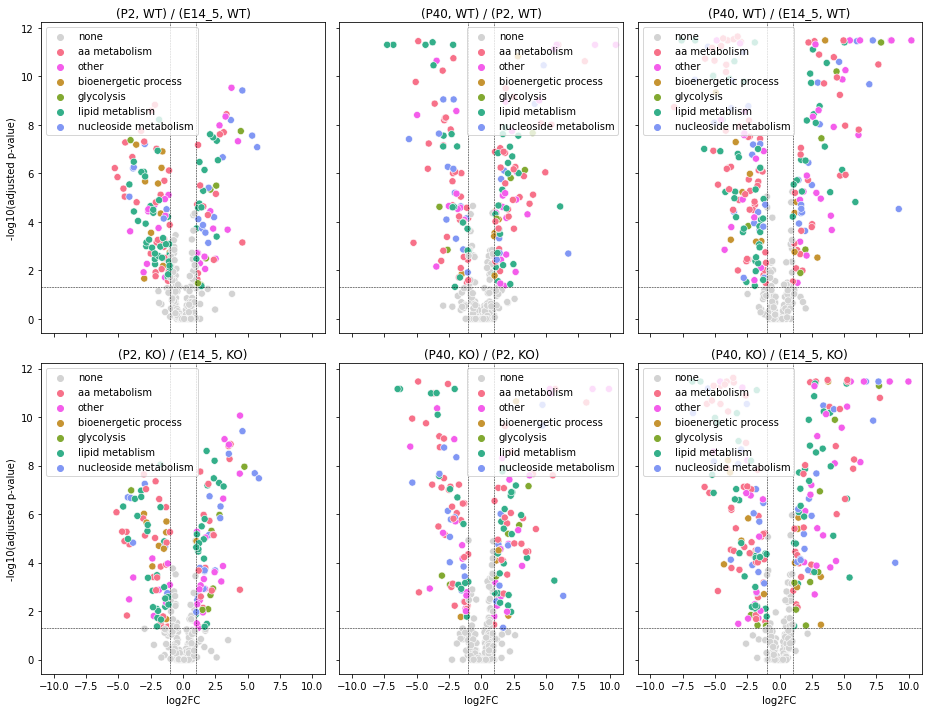

In [16]:
import numpy as np
from adjustText import adjust_text
import matplotlib.pyplot as plt
import seaborn as sns
fig, axs = plt.subplots(2, 3, sharey = True, sharex = True)
data_key = 'HILIC'
data = basedata[data_key]
pval_threshold = 0.05
abs_lfc_threshold = 1
deregulated_with = set()
deregulated_without = set()
annotate = False
for i, key, contrasts in zip(
    range(2),
    ['WT', 'KO'],
    [
        ['(P2, WT) / (E14_5, WT)', '(P40, WT) / (P2, WT)', '(P40, WT) / (E14_5, WT)'],
        ['(P2, KO) / (E14_5, KO)', '(P40, KO) / (P2, KO)', '(P40, KO) / (E14_5, KO)']
    ]
):
    for contrast, ax in zip(contrasts, axs[i, :]):
        hue_idx = (np.abs(data[contrast].astype(float)) >= abs_lfc_threshold) & \
            (data[contrast + '.1'].astype(float) < pval_threshold)
        
        data.loc[
            (data[contrast].astype(float) >= abs_lfc_threshold) & 
            (data[contrast + '.1'].astype(float) < pval_threshold),
            ['ID', 'Name', contrast, contrast + '.1']
        ].to_csv(
            f'../results/metabolomics_{data_key}_{contrast}_up.tsv'.replace(', ', '').replace('(', '').replace(')', '').replace(' / ', '_'),
            sep = '\t',
            index = False
        )
        data.loc[
            (data[contrast].astype(float) <= abs_lfc_threshold) & 
            (data[contrast + '.1'].astype(float) < pval_threshold),
            ['ID', 'Name', contrast, contrast + '.1']
        ].to_csv(
            f'../results/metabolomics_{data_key}_{contrast}_down.tsv'.replace(', ', '').replace('(', '').replace(')', '').replace(' / ', '_'),
            sep = '\t',
            index = False
        )
        hue_map = [s.metabolitegroupcoarse if sig else 'none' for (i, s), sig in zip(data.iterrows(), hue_idx)]
        palette_dict = {
            k: sns.color_palette('husl', len(np.unique(hue_map)))[i] for i, k in enumerate(np.unique(hue_map))
        }
        palette_dict['none'] = 'lightgrey'
        sns.scatterplot(
            x = data[contrast].astype(float),
            y = -np.log10(data[contrast + '.1'].astype(float)),
            ax = ax,
            hue = [s.metabolitegroupcoarse if sig else 'none' for (i, s), sig in zip(data.iterrows(), hue_idx)],
            palette = palette_dict,
            s = 50
        )
        if key == 'WT':
            deregulated_with.update(
                data.loc[hue_idx, 'ID'].to_list()
            )
            if not contrast == '(P40, WT) / (E14_5, WT)':
                deregulated_without.update(
                    data.loc[hue_idx, 'ID'].to_list()
                )
        
        if annotate:
            # sort metabolites by adjusted pvalue
            metabolites = highlights[highlights.data_type == data_key].metabolites.str.strip().values
            padj = data.loc[data.Name.isin(metabolites)].drop_duplicates(
                subset = 'Name',
                keep = 'first'
            )
            padj['logpadj'] = -np.log10(padj[contrast + '.1'].astype(float))
            padj['lfc'] = padj[contrast].astype(float)
            padj = padj.sort_values(
                by = 'logpadj'
            ).reset_index()

            for i, row in padj.iterrows():
                x = row['lfc']
                y = row['logpadj']
                ax.annotate(
                    row.Name,
                    xy = (x, y), 
                    xycoords = 'data',
                    xytext = (0 if x < 0 else 1, i * 1 / (highlights.data_type == data_key).sum()), 
                    textcoords = 'axes fraction',
                    arrowprops = dict(arrowstyle = '-', color = 'grey'),
                    ha = 'left' if x < 0 else 'right',
                    va = 'bottom',
                    bbox = dict(boxstyle="round", facecolor = 'white')
                )
            
        for x in [
            -abs_lfc_threshold, 
            abs_lfc_threshold
        ]:
            ax.axvline(
                x = x,
                ls = '--',
                lw = 0.5,
                c = 'k'
            )
            
        ax.set_xlabel('log2FC')
        ax.set_ylabel('-log10(adjusted p-value)')
        
        ax.axhline(
            y = -np.log10(pval_threshold),
            ls = '--',
            lw = 0.5,
            c = 'k'
        )
        ax.set_xlim(-11, 11)
        ax.set_title(contrast)

fig.set_figwidth(13)
fig.set_figheight(10)
fig.tight_layout()
fig.savefig('../plots/metabolomics_vulcano_hilicbase_50.pdf')

In [17]:
print(
    'Of {} metabolites detected {} are deregulated at some point in time during development if P40/E14.5 is also taken in to account'.format(
        len(data.ID.unique()), len(deregulated_with)
    )
)
print(
    'Of {} metabolites detected {} are deregulated at some point in time during development if P40/E14.5 is not taken in to account'.format(
        len(data.ID.unique()), len(deregulated_without)
    )
)
for dereg_set, filename in zip(
    [deregulated_with, deregulated_without, deregulated_with.difference(deregulated_without)],
    ['deregulated_with_P40_E14_5.hilicbase..txt', 'deregulated_without_P40_E14_5.hilicbase.txt', 'dereg_difference.hilicbase.txt']
):
    tmp = data.loc[data.ID.isin(dereg_set), ['ID', 'Name', 'metabolitegroupfine', 'metabolitegroupcoarse']]
    tmp.to_csv(
        f'../results/{filename}', 
        sep = '\t', 
        index = False
    )

Of 346 metabolites detected 273 are deregulated at some point in time during development if P40/E14.5 is also taken in to account
Of 346 metabolites detected 244 are deregulated at some point in time during development if P40/E14.5 is not taken in to account


/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a l

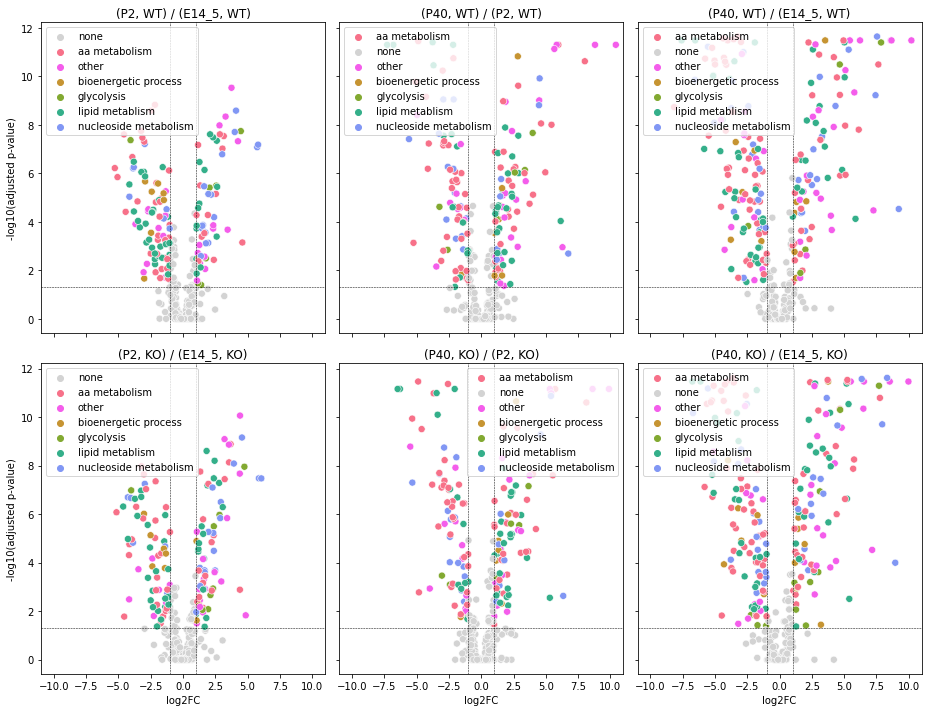

In [18]:
import numpy as np
from adjustText import adjust_text
fig, axs = plt.subplots(2, 3, sharey = True, sharex = True)
data_key = 'RP'
data = basedata[data_key]
pval_threshold = 0.05
abs_lfc_threshold = 1
deregulated_with = set()
deregulated_without = set()
annotate = False
for i, key, contrasts in zip(
    range(2),
    ['WT', 'KO'],
    [
        ['(P2, WT) / (E14_5, WT)', '(P40, WT) / (P2, WT)', '(P40, WT) / (E14_5, WT)'],
        ['(P2, KO) / (E14_5, KO)', '(P40, KO) / (P2, KO)', '(P40, KO) / (E14_5, KO)']
    ]
):
    for contrast, ax in zip(contrasts, axs[i, :]):
        hue_idx = (np.abs(data[contrast].astype(float)) >= abs_lfc_threshold) & \
            (data[contrast + '.1'].astype(float) < pval_threshold)
        
        data.loc[
            (data[contrast].astype(float) >= abs_lfc_threshold) & 
            (data[contrast + '.1'].astype(float) < pval_threshold),
            ['ID', 'Name', contrast, contrast + '.1']
        ].to_csv(
            f'../results/metabolomics_{data_key}_{contrast}_up.tsv'.replace(', ', '').replace('(', '').replace(')', '').replace(' / ', '_'),
            sep = '\t',
            index = False
        )
        data.loc[
            (data[contrast].astype(float) <= abs_lfc_threshold) & 
            (data[contrast + '.1'].astype(float) < pval_threshold),
            ['ID', 'Name', contrast, contrast + '.1']
        ].to_csv(
            f'../results/metabolomics_{data_key}_{contrast}_down.tsv'.replace(', ', '').replace('(', '').replace(')', '').replace(' / ', '_'),
            sep = '\t',
            index = False
        )
        
        hue_map = [s.metabolitegroupcoarse if sig else 'none' for (i, s), sig in zip(data.iterrows(), hue_idx)]
        palette_dict = {
            k: sns.color_palette('husl', len(np.unique(hue_map)))[i] for i, k in enumerate(np.unique(hue_map))
        }
        palette_dict['none'] = 'lightgrey'
        sns.scatterplot(
            x = data[contrast].astype(float),
            y = -np.log10(data[contrast + '.1'].astype(float)),
            ax = ax,
            hue = [s.metabolitegroupcoarse if sig else 'none' for (i, s), sig in zip(data.iterrows(), hue_idx)],
            palette = palette_dict,
            s = 50
        )
        if key == 'WT':
            deregulated_with.update(
                data.loc[hue_idx, 'ID'].to_list()
            )
            if not contrast == '(P40, WT) / (E14_5, WT)':
                deregulated_without.update(
                    data.loc[hue_idx, 'ID'].to_list()
                )
        
        if annotate:
            # sort metabolites by adjusted pvalue
            metabolites = highlights[highlights.data_type == data_key].metabolites.str.strip().values
            padj = data.loc[data.Name.isin(metabolites)].drop_duplicates(
                subset = 'Name',
                keep = 'first'
            )
            padj['logpadj'] = -np.log10(padj[contrast + '.1'].astype(float))
            padj['lfc'] = padj[contrast].astype(float)
            padj = padj.sort_values(
                by = 'logpadj'
            ).reset_index()

            for i, row in padj.iterrows():
                x = row['lfc']
                y = row['logpadj']
                ax.annotate(
                    row.Name,
                    xy = (x, y), 
                    xycoords = 'data',
                    xytext = (0 if x < 0 else 1, i * 1 / (highlights.data_type == data_key).sum()), 
                    textcoords = 'axes fraction',
                    arrowprops = dict(arrowstyle = '-', color = 'grey'),
                    ha = 'left' if x < 0 else 'right',
                    va = 'bottom',
                    bbox = dict(boxstyle="round", facecolor = 'white')
                )
            
        for x in [
            -abs_lfc_threshold, 
            abs_lfc_threshold
        ]:
            ax.axvline(
                x = x,
                ls = '--',
                lw = 0.5,
                c = 'k'
            )
            
        ax.set_xlabel('log2FC')
        ax.set_ylabel('-log10(adjusted p-value)')
        
        ax.axhline(
            y = -np.log10(pval_threshold),
            ls = '--',
            lw = 0.5,
            c = 'k'
        )
        ax.set_xlim(-11, 11)
        ax.set_title(contrast)

fig.set_figwidth(13)
fig.set_figheight(10)
fig.tight_layout()
fig.savefig('../plots/metabolomics_vulcano_rpbase_50.pdf')

In [19]:
print(
    'Of {} metabolites detected {} are deregulated at some point in time during development if P40/E14.5 is also taken in to account'.format(
        len(data.ID.unique()), len(deregulated_with)
    )
)
print(
    'Of {} metabolites detected {} are deregulated at some point in time during development if P40/E14.5 is not taken in to account'.format(
        len(data.ID.unique()), len(deregulated_without)
    )
)
for dereg_set, filename in zip(
    [deregulated_with, deregulated_without, deregulated_with.difference(deregulated_without)],
    ['deregulated_with_P40_E14_5.rpcbase..txt', 'deregulated_without_P40_E14_5.rpbase.txt', 'dereg_difference.rpbase.txt']
):
    tmp = data.loc[data.ID.isin(dereg_set), ['ID', 'Name', 'metabolitegroupfine', 'metabolitegroupcoarse']]
    tmp.to_csv(
        f'../results/{filename}', 
        sep = '\t', 
        index = False
    )

Of 341 metabolites detected 273 are deregulated at some point in time during development if P40/E14.5 is also taken in to account
Of 341 metabolites detected 246 are deregulated at some point in time during development if P40/E14.5 is not taken in to account


## Timecourse clustering

In [20]:
from sklearn.mixture import GaussianMixture
import numpy as np
def group_by_timecourse(data, data_cols, data_col_grouping, gm_components):
    gm_data = data.loc[:, data_cols]
    gm_data = gm_data.T
    gm_data = gm_data.groupby(data_col_grouping).mean().T
    
    # normalize over timepoints such that all values are between 0 and 1
    gm_data = gm_data.apply(
        lambda x: (x - x.min()) / (x.max() - x.min()),
        axis = 1
    )

    gm = GaussianMixture(
        n_components = gm_components,
        random_state = 19378,
        covariance_type = 'full'
    )
    
    clusters = gm.fit_predict(gm_data.values)
    scores = {
        'aic': gm.aic(gm_data.values),
        'bic': gm.bic(gm_data.values)
    }
    
    return gm_data, clusters, scores

def get_optimal_ncomponents(data, data_columns, ncomponent_range):
    aic, bic = [], []
    for ncomponents in ncomponent_range:
        cluster_data, clusters, scores = group_by_timecourse(
            data,
            data_columns,
            [c[4:-1] for c in data_columns],
            gm_components = ncomponents
        )

        for scorelist, scorekey in zip([aic, bic], ['aic', 'bic']):
            scorelist.append(scores[scorekey])
    
    return np.argmin(bic) + min(ncomponent_range), aic, bic

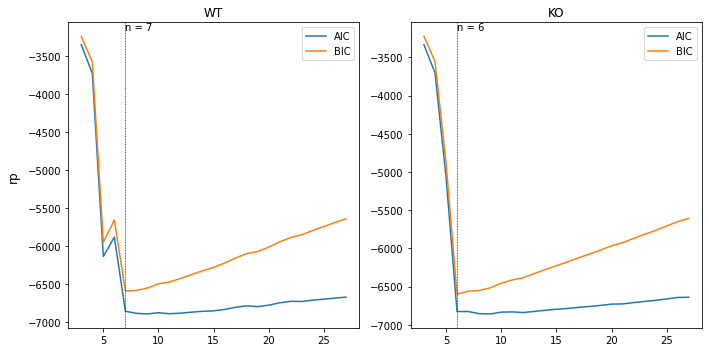

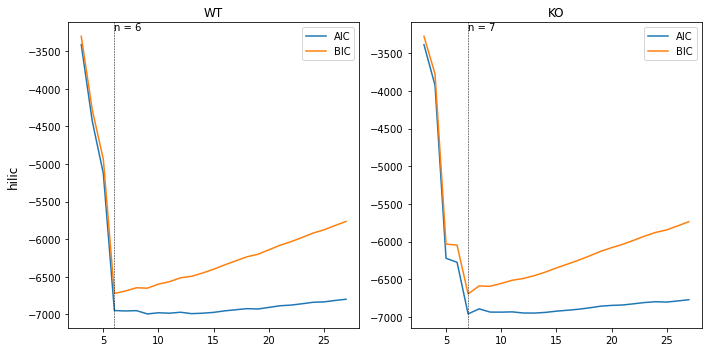

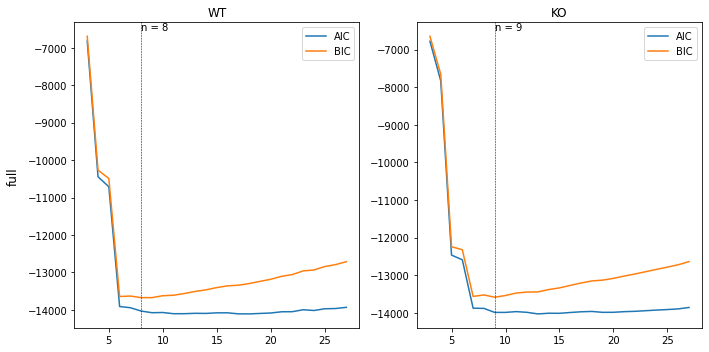

In [21]:
import matplotlib.pyplot as plt
hilicbase = basedata['HILIC']
hilicbase.index = hilicbase.ID.to_list()
hilic_data = hilicbase.loc[:, hilicbase.columns[hilicbase.columns.str.startswith('S')]].astype(float)

rpbase = basedata['RP']
rpbase.index = rpbase.ID.to_list()
rp_data = rpbase.loc[:, rpbase.columns[rpbase.columns.str.startswith('S')]].astype(float)

full_data = pd.concat([rp_data, hilic_data])

# doesn't matter from which dataframe this is taken both contain the same information
wt_data_columns = rp_data.columns[rp_data.columns.str.match('S[0-9]{2}_[EP][0-9][_0-9]+WT[0-9]')].to_list()
ko_data_columns = rp_data.columns[rp_data.columns.str.match('S[0-9]{2}_[EP][0-9][_0-9]+KO[0-9]')].to_list()

for datatype, data in zip(
    ['rp', 'hilic', 'full'], 
    [rp_data, hilic_data, full_data]
):
    fig, axs = plt.subplots(1, 2)
    optimal_ncomponents = {}
    for ax, data_columns, key in zip(
        axs,
        [wt_data_columns, ko_data_columns],
        ['WT', 'KO']
    ):
        ncomp_range = list(range(3, 28))
        opt_ncomponents, aic, bic = get_optimal_ncomponents(
            data,
            data_columns,
            ncomp_range
        )
        optimal_ncomponents[key] = opt_ncomponents
        for scores, label in zip([aic, bic], ['AIC', 'BIC']):
            ax.plot(
                ncomp_range, 
                scores, 
                label = label
            )

        ax.set_title(key)
        ax.axvline(
            opt_ncomponents, 
            ls = '--', 
            lw = 0.5,
            c = 'k'
        )
        ax.text(
            opt_ncomponents, 
            ax.get_ylim()[1], 
            f'n = {opt_ncomponents}', 
            ha = 'left', 
            va = 'top'
        )
        ax.legend()
    
    fig.supylabel(f'{datatype}')
    fig.set_figwidth(10)
    fig.set_figheight(5)
    fig.tight_layout()
    fig.savefig(f'../plots/aicbic_clustering_{datatype}.pdf')

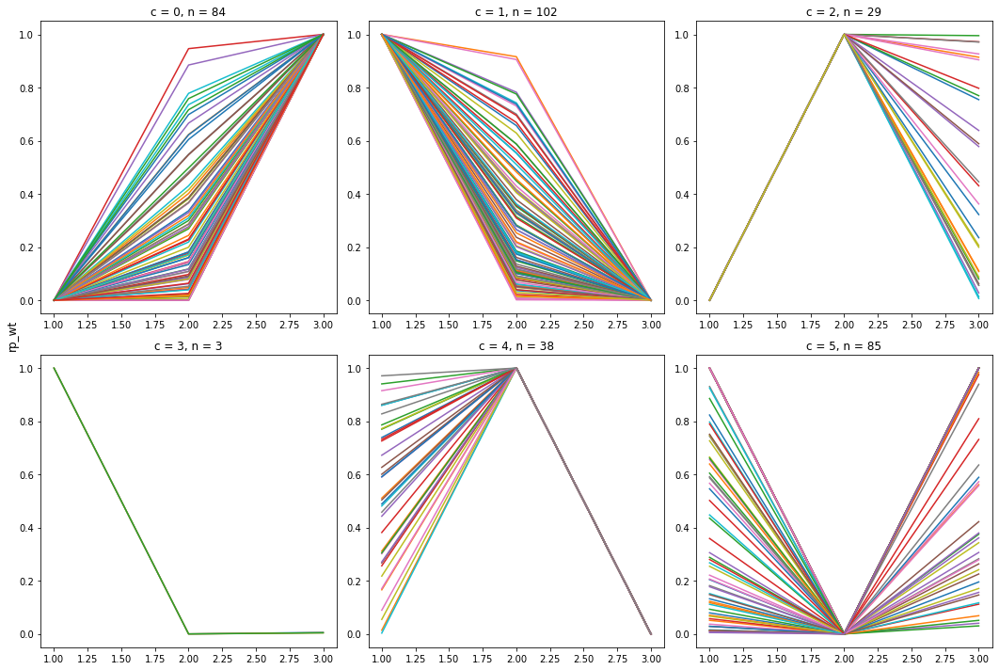

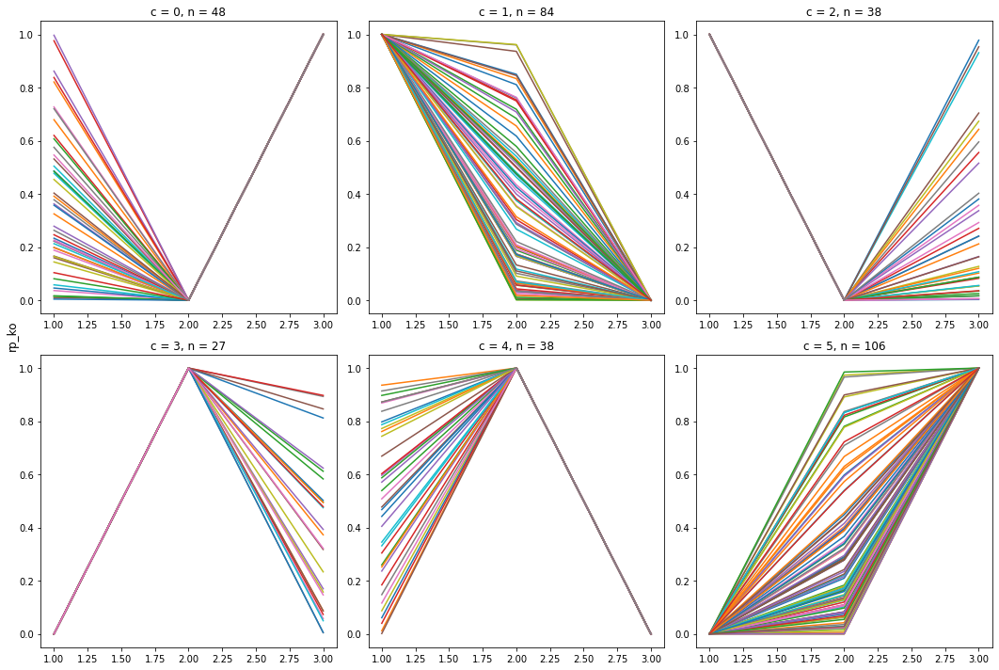

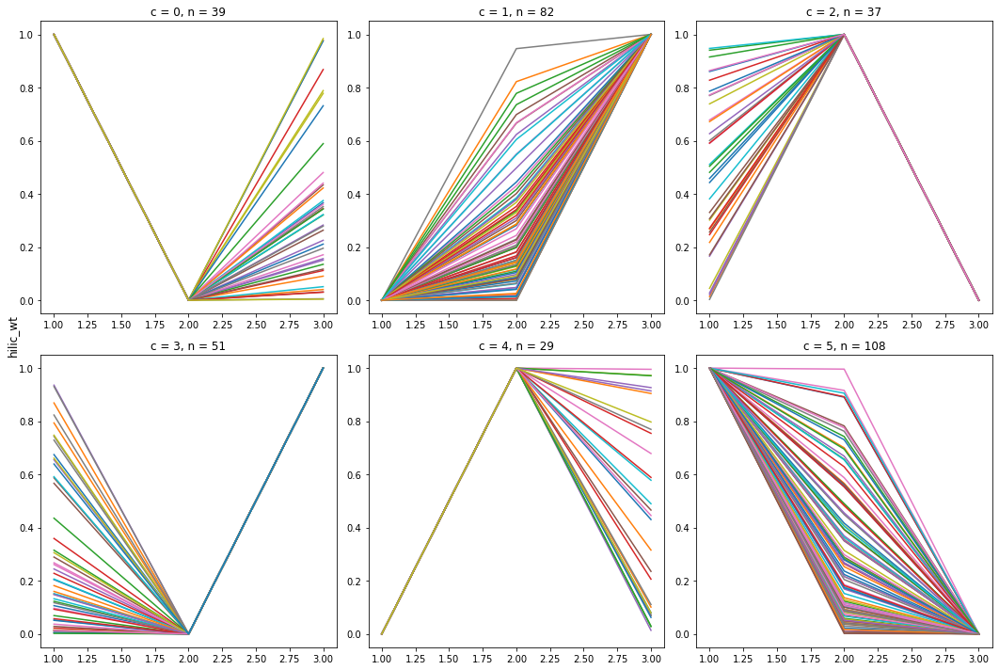

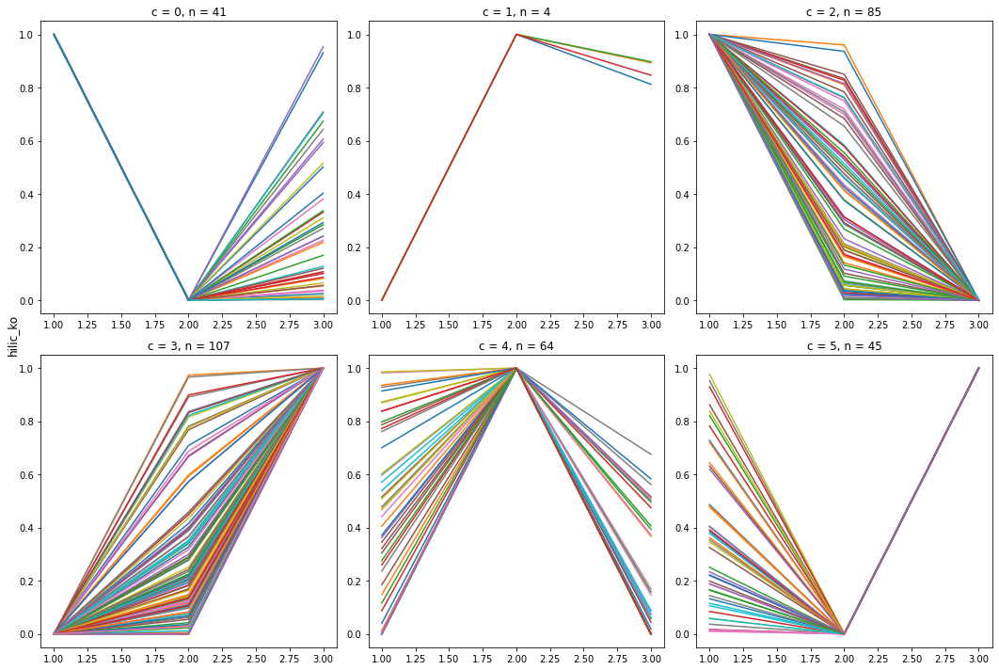

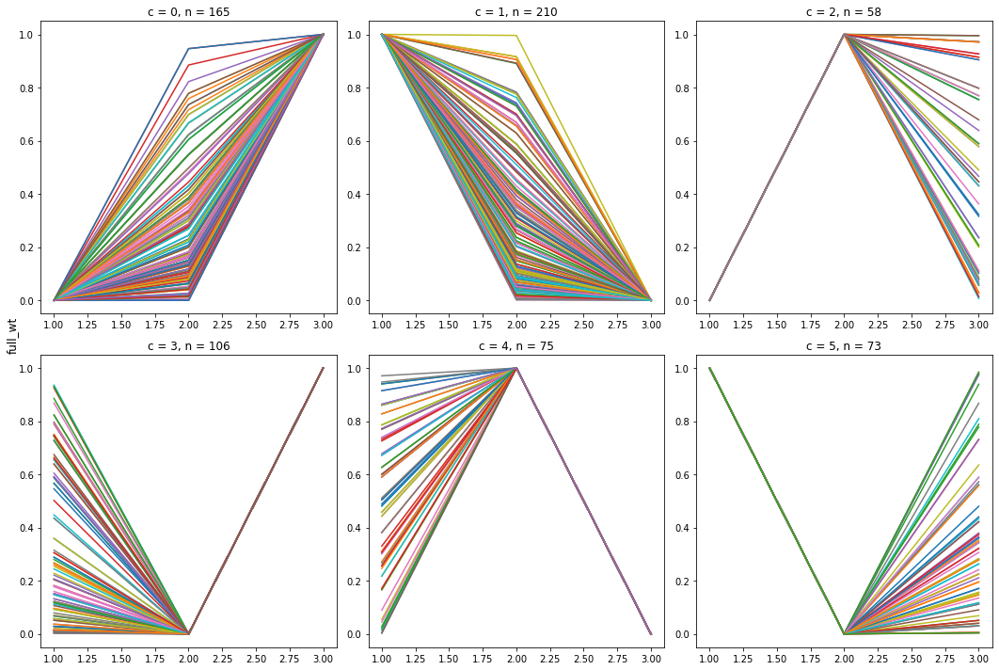

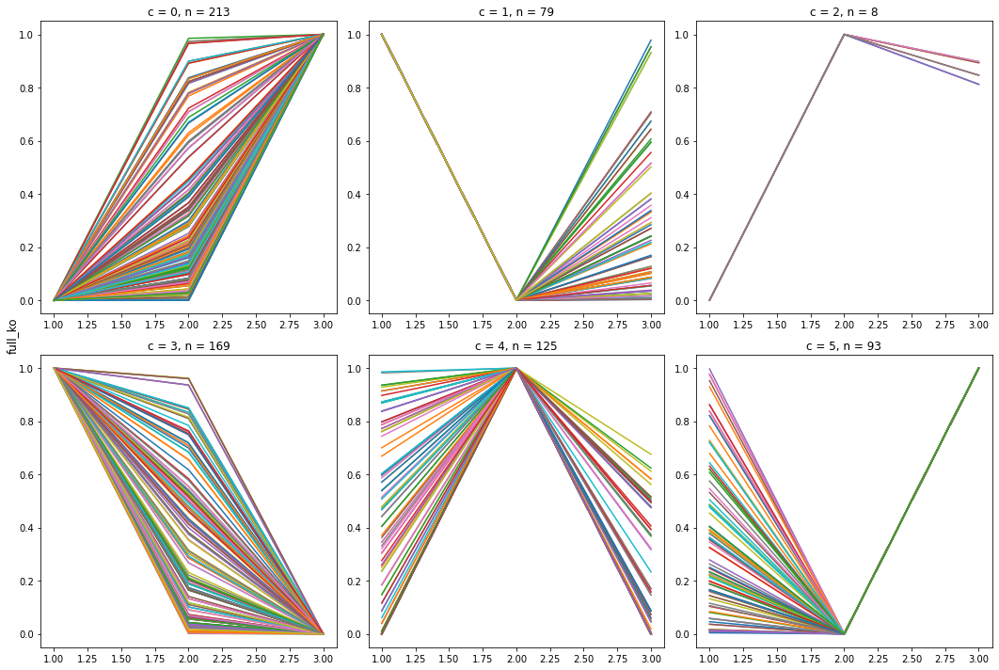

In [22]:
n_components = 6
clustering_results = {}
for datatype, data in zip(['rp', 'hilic', 'full'], [rp_data, hilic_data, full_data]):
    for condition, data_cols in zip(
        ['wt', 'ko'],
        [wt_data_columns, ko_data_columns]
    ):
        cluster_data, clusters, _ = group_by_timecourse(
            data,
            data_cols,
            [c[4:-1] for c in data_cols],
            gm_components = n_components
        )
        resultkey = f'{datatype}_{condition}'
        clustering_results[resultkey] = {
            'data': cluster_data,
            'clusters': clusters
        }
        
        fig, axs = plt.subplots(2, 3)
        fig.supylabel(resultkey)
        for i, ax in zip(np.unique(clusters), axs.reshape(n_components)):
            for j, row in cluster_data.loc[clusters == i, :].iterrows():
                ax.plot([1, 2, 3], row)
                ax.set_title('c = {}, n = {}'.format(i, (clusters == i).sum()))
        
        fig.set_figwidth(15)
        fig.set_figheight(10)
        fig.tight_layout()

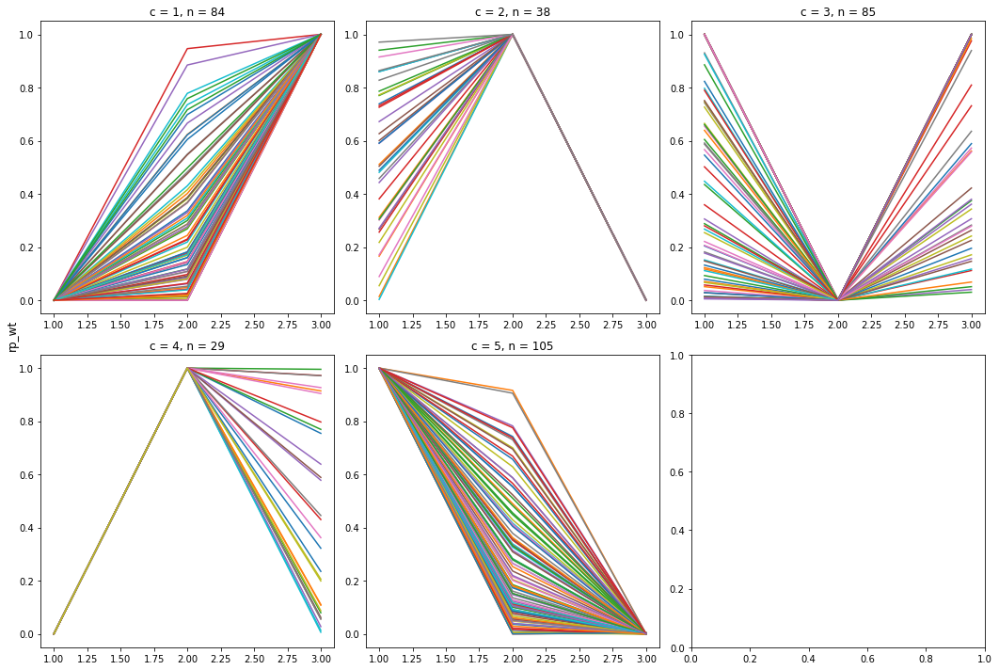

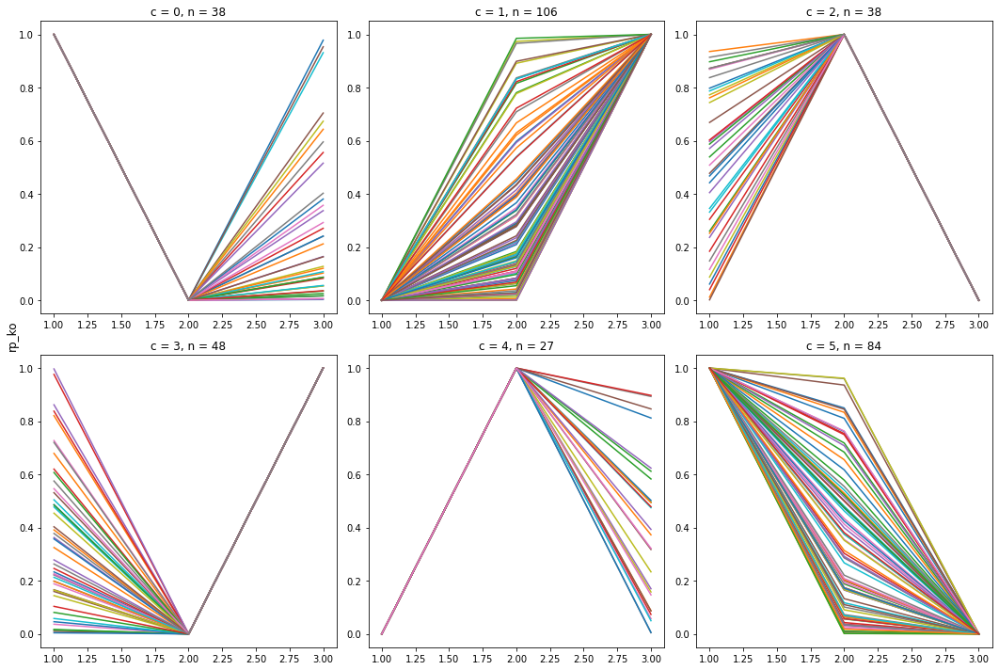

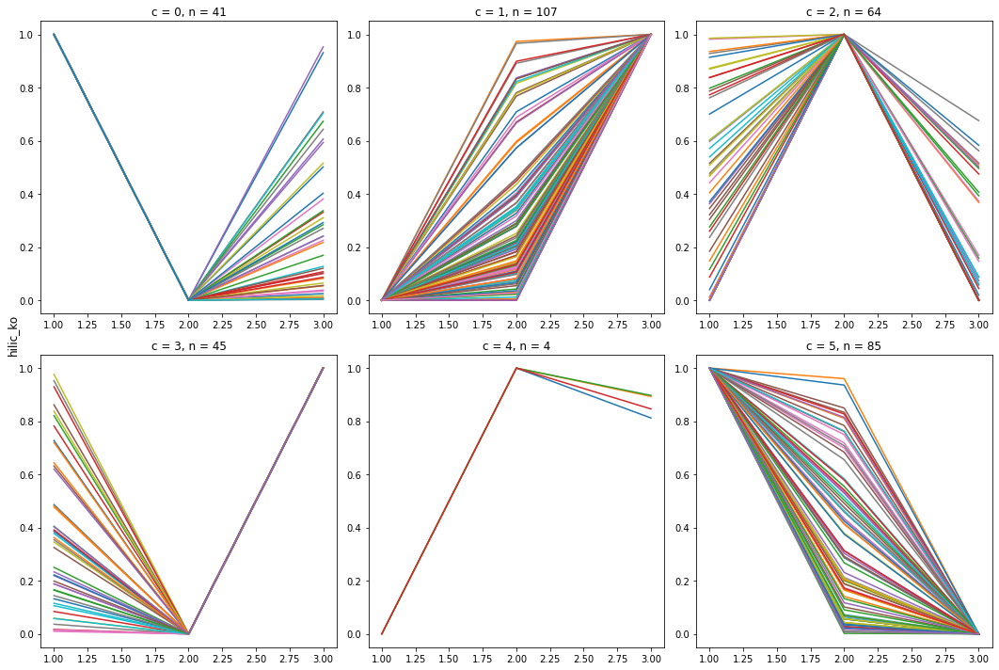

In [23]:
from sklearn.metrics import pairwise_distances
import itertools as it
def align_clusters(data1, data2, clusters1, clusters2):
    cluster_means1 = data1.groupby(clusters1).mean()
    cluster_means2 = data2.groupby(clusters2).mean()
    
    paired_distances = pairwise_distances(
        cluster_means1, 
        cluster_means2
    )
    
    cluster_map = np.argmin(paired_distances, axis = 0)
    aligned_clusters2 = np.array(
        [cluster_map[i] for i in clusters2]
    )
    return aligned_clusters2

ref_data, ref_clusters = [clustering_results['hilic_wt'][k] for k in ['data', 'clusters']]
for resultkey in ['rp_wt', 'rp_ko', 'hilic_ko']:
    fig, axs = plt.subplots(2, 3)
    clusters_aligned = align_clusters(
        ref_data, 
        clustering_results[resultkey]['data'], 
        ref_clusters, 
        clustering_results[resultkey]['clusters']
    )
    
    clustering_results[resultkey]['clusters'] = clusters_aligned
    for i, ax in zip(np.unique(clusters_aligned), axs.reshape(n_components)):
        for j, row in clustering_results[resultkey]['data'].loc[clusters_aligned == i, :].iterrows():
            ax.plot([1, 2, 3], row)
            ax.set_title('c = {}, n = {}'.format(i, (clusters_aligned == i).sum()))
    
    fig.supylabel(resultkey)
    fig.set_figwidth(15)
    fig.set_figheight(10)
    fig.tight_layout()

In [24]:
hilicbase = basedata['HILIC']
rpbase = basedata['RP']
hilic_kegg_idx = ~hilicbase.KEGG.isna()
kegg = hilicbase.loc[hilic_kegg_idx, :]
kegg_only_clustering_results = {}
for condition in ['wt', 'ko']:
    resultkey = f'hilic_{condition}'
    kegg_only_clustering_results[condition] = {
        'data': clustering_results[resultkey]['data'].loc[hilic_kegg_idx, :],
        'clusters': clustering_results[resultkey]['clusters'][hilic_kegg_idx]
    }

rp_kegg_idx = ~rpbase.KEGG.isna() & ~rpbase.KEGG.isin(kegg.KEGG) & ~rpbase.Name.isin(kegg.Name)
rp_kegg = rpbase.loc[rp_kegg_idx]
for condition, results in kegg_only_clustering_results.items():
    resultkey = f'rp_{condition}'
    kegg_only_clustering_results[condition] = {
        'data': pd.concat(
            [
                clustering_results[resultkey]['data'].loc[rp_kegg_idx, :],
                results['data']
            ]
        ),
        'clusters': np.concatenate(
            [
                clustering_results[resultkey]['clusters'][rp_kegg_idx],
                results['clusters']
            ]
        )
    }
    
metabo = pd.concat([rp_kegg, kegg])
metabo

,ID,metabolitename,metabolitegroupfine,metabolitegroupcoarse,Name,Calc. MW,RT [min],"(P40, KO) / (P40, WT)","(P2, KO) / (P2, WT)","(E14_5, KO) / (E14_5, WT)",...,Molecular Weight,RT [min]2,DeltaMass [ppm],DBID,Reference List Name,mzLogic Score,ChemSpider ID,KEGG,HMDB,Mass List Search Results ID
B086_RP,B086_RP,Methionine,AA Metabolism / Methionine,aa metabolism,Methionine,149.0512,6.85,0.050000000000000,0.570000000000000,-0.040000000000000,...,149.0511,NaN,0.75,NaN,NaN,NaN,NaN,C01733,NaN,NaN
A002_HILIC,A002_HILIC,L-(+)-Alanine,AA Metabolism / Alanine,aa metabolism,L-(+)-Alanine,89.0477,14.83,0.000000000000000,-0.050000000000000,-0.040000000000000,...,89.0477,14.80,0.344160806154653,A072,iHILIC_neg_2020,74.927524987884600,5735,C00041,HMDB0000161,57
A054_HILIC,A054_HILIC,L-(+)-Arginine,AA metabolism / Arginine,aa metabolism,L-(+)-Arginine,174.1118,25.41,-0.140000000000000,0.620000000000000,0.290000000000000,...,174.1117,25.52,0.641924492422151,E3,iHILIC_pos_2020,92.728514672556900,6082,C00062,HMDB0000517,285
A062_HILIC,A062_HILIC,"NG,NG-dimethylarginine",AA metabolism / Arginine,aa metabolism,"NG,NG-dimethylarginine",202.1431,22.44,0.430000000000000,0.750000000000000,0.180000000000000,...,202.1430,22.61,0.537206277676440,A105,iHILIC_pos_2020,54.522594183866700,110375,C03626,HMDB0001539,437
B122_HILIC,B122_HILIC,Creatine,AA metabolism / Arginine / Glycine,aa metabolism,Creatine,131.0695,14.89,0.010000000000000,0.010000000000000,-0.070000000000000,...,131.0695,NaN,0.10,NaN,NaN,NaN,NaN,C00300,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A041_RP,A041_RP,p-Hydroxyphenyllactic acid,Glycolysis / Lactate,glycolysis,p-Hydroxyphenyllactic acid,182.0581,14.25,-0.100000000000000,0.080000000000000,-0.540000000000000,...,182.0579,14.27,0.764242678869818,A133,RP_neg_2020,77.500533213997900,9010,C03964,HMDB0000755,407
a078_RP,a078_RP,Prostaglandin D2,Lipid metabolism / Arachidonic acid derivative,lipid metablism,Prostaglandin D2,352.2252,24.82,0.480000000000000,-0.810000000000000,0.110000000000000,...,352.2250,24.90,0.596348247646535,F011,RP_neg_2020,None,395250,C00696,HMDB0001403,430
B104_RP,B104_RP,3'-Adenosine monophosphate (3'-AMP),Nucleoside metabolism,nucleoside metabolism,3'-Adenosine monophosphate (3'-AMP),347.0631,6.04,-0.070000000000000,0.090000000000000,0.050000000000000,...,347.0631,NaN,0.10,NaN,NaN,NaN,NaN,C01367,NaN,NaN
A059_RP,A059_RP,5-Deoxy-5'-(methylthio) adenosine (MTA),Nucleoside metabolism,nucleoside metabolism,5-Deoxy-5'-(methylthio) adenosine (MTA),297.0897,12.83,0.180000000000000,-0.010000000000000,0.210000000000000,...,297.0896,12.95,0.594295644107247,C014,RP_neg_2020,93.088770949661900,388321,C00170,HMDB0001173,131


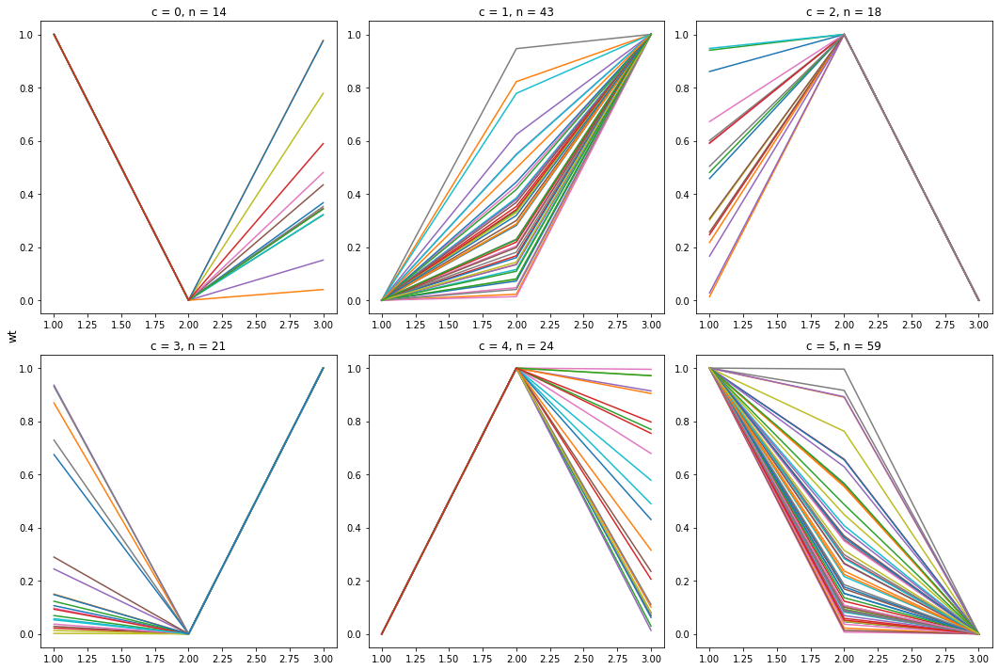

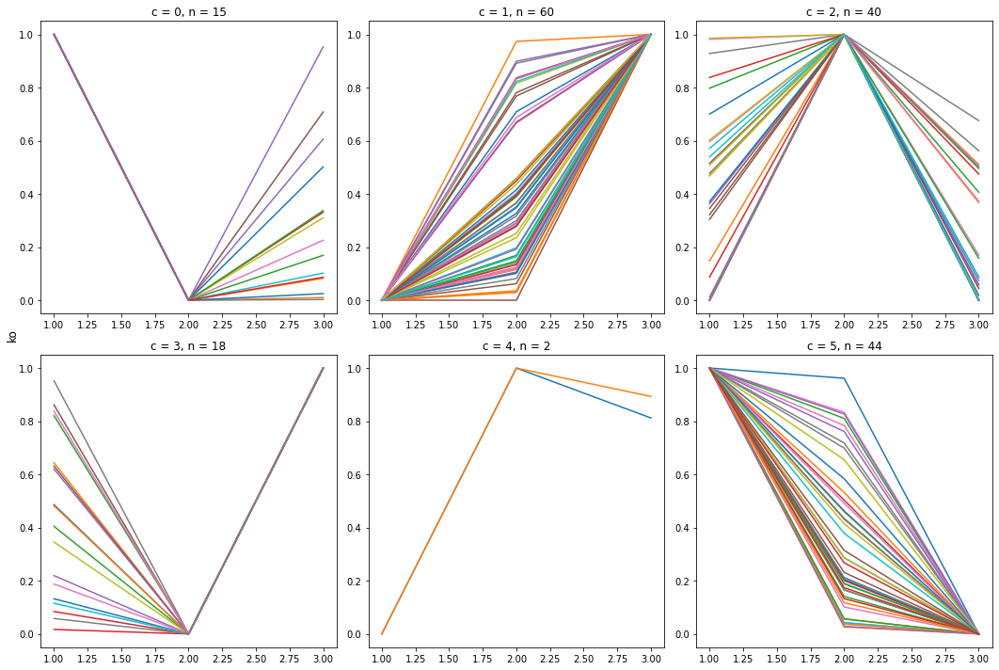

In [25]:
for condition, results in kegg_only_clustering_results.items():
    fig, axs = plt.subplots(2, 3)
    for i, ax in zip(np.unique(results['clusters']), axs.reshape(n_components)):
        for j, row in results['data'].loc[results['clusters'] == i, :].iterrows():
            ax.plot([1, 2, 3], row)
        ax.set_title('c = {}, n = {}'.format(i, (results['clusters'] == i).sum()))
    
    fig.supylabel(condition)
    fig.set_figwidth(15)
    fig.set_figheight(10)
    fig.tight_layout()
    fig.savefig(f'../plots/metabolomics_trajectory_grouping_{condition}.pdf')

In [26]:
# load pickled results from above cell
import pickle
with open('../raw/kegg_pathway_maps.pickle', 'rb') as handle:
    pathwaymaps = pickle.load(handle)
    
bcaa_ids = set()
for p in ['mmu00290', 'mmu00280']:
    pathway = pathwaymaps[p]
    for id_, _ in pathway['COMPOUND'].items():
        bcaa_ids.add(id_)

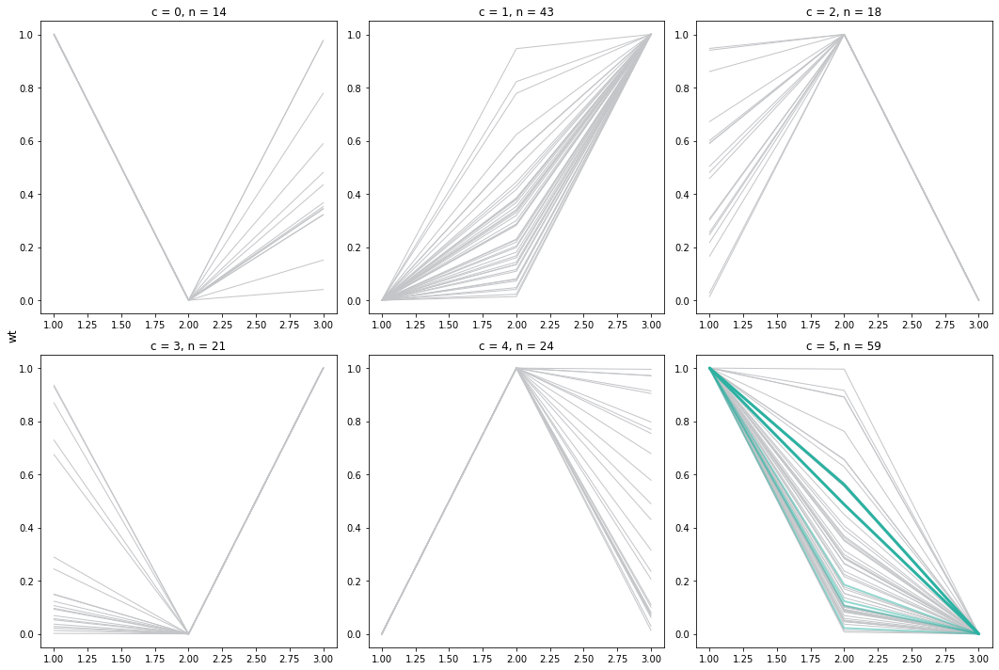

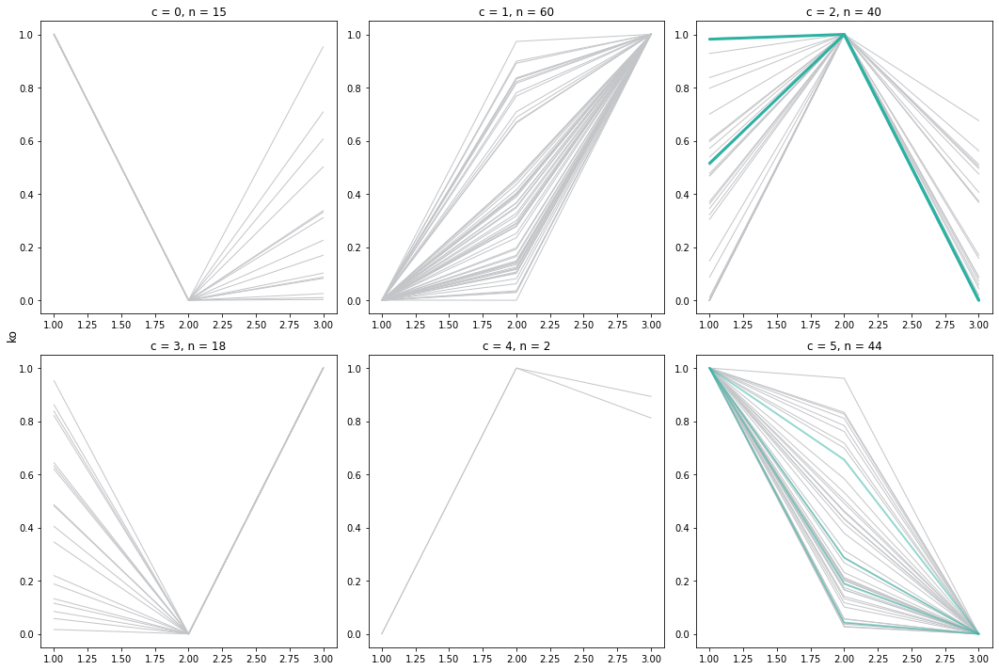

In [27]:
for condition, results in kegg_only_clustering_results.items():
    fig, axs = plt.subplots(2, 3)
    for i, ax in zip(np.unique(results['clusters']), axs.reshape(n_components)):
        for j, row in results['data'].loc[results['clusters'] == i, :].iterrows():
            if metabo.loc[j, 'KEGG'] in bcaa_ids:
                lw = 3 if metabo.loc[j, 'metabolitename'] in ['L-(+)-Isoleucine', 'L-Leucine', 'L-Valine'] else 2
                alpha = 1 if metabo.loc[j, 'metabolitename'] in ['L-(+)-Isoleucine', 'L-Leucine', 'L-Valine'] else 0.5
                ax.plot([1, 2, 3], row, c = '#2CB1A2', linewidth = lw, alpha = alpha, zorder = 100, solid_capstyle = 'round')
            
            else:
                ax.plot([1, 2, 3], row, lw = 1, c = '#C4C5C8')
                
        ax.set_title('c = {}, n = {}'.format(i, (results['clusters'] == i).sum()))
    
    fig.supylabel(condition)
    fig.set_figwidth(15)
    fig.set_figheight(10)
    fig.tight_layout()
    fig.savefig(f'../plots/metabolomics_trajectory_grouping_{condition}.bcaahighlight.pdf')

## Investigate timecourses

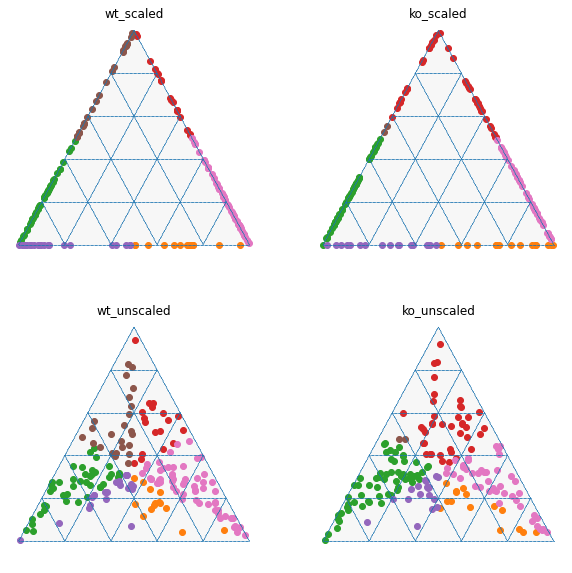

In [28]:
import ternary

fig, axs = plt.subplots(2, 2)
for i, dtype in enumerate(['scaled', 'unscaled']):
    for j, key in enumerate(['wt', 'ko']):
        tax = ternary.TernaryAxesSubplot(ax=axs[i, j], scale = 100)

        if dtype == 'unscaled':
            if key == 'wt':
                test = metabo.loc[:, wt_data_columns].astype(float).T.groupby([s[4:-1] for s in wt_data_columns]).mean().T

            else:
                test = metabo.loc[:, ko_data_columns].astype(float).T.groupby([s[4:-1] for s in ko_data_columns]).mean().T

        else:
            test = kegg_only_clustering_results[key]['data'].copy()

        cols = [s.format(key.upper()) for s in ['E14_5_{}', 'P2_{}', 'P40_{}']]
        for col in cols:
            test[col + 'norm'] = test[col] * 100 / test[cols].sum(axis = 1)
            
        clusters = kegg_only_clustering_results[key]['clusters']
        for clust in np.unique(clusters):
            tax.scatter(
                test.loc[clusters == clust, [c + 'norm' for c in cols]].values,
            )
            tax.gridlines(multiple=20)
            tax.get_axes().axis('off')
        
        tax.set_title(f'{key}_{dtype}')
        
fig.set_size_inches(10, 10)

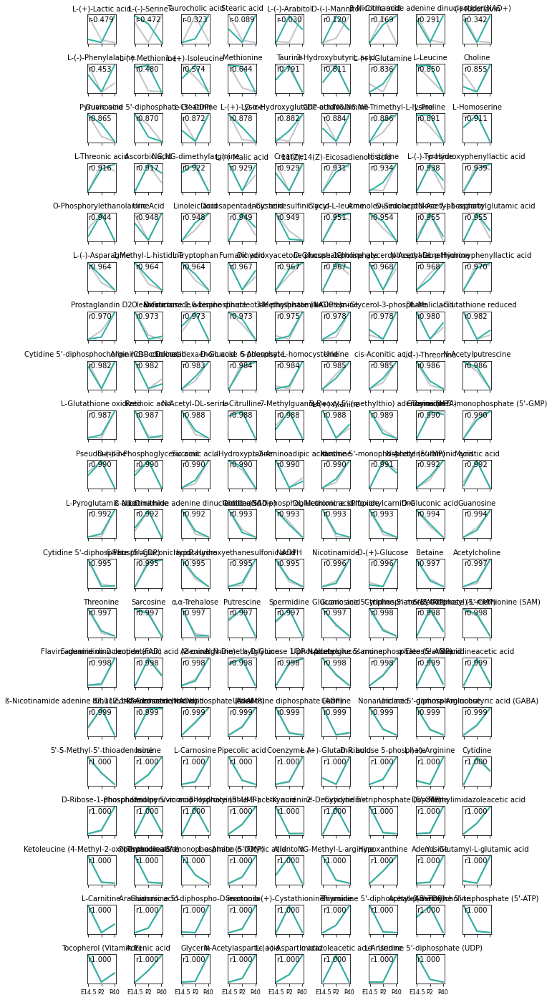

In [29]:
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics.pairwise import cosine_similarity
fig, axs = plt.subplots(20, 9, sharex = True, sharey = True)
correlations = []
for metabolite in metabo.index:
    correlations.append(
        pearsonr(
            kegg_only_clustering_results['wt']['data'].loc[metabolite, :].values,
            kegg_only_clustering_results['ko']['data'].loc[metabolite, :].values
        )[0]
    )

metabo.loc[np.array(correlations) < 0.975, ['Name', 'KEGG']].to_csv(
    '../results/metabolomics_changed_dynamics.tsv',
    sep = '\t',
    index = False
)

sort_idx = np.argsort(correlations)
for i, ax in zip(sort_idx, axs.reshape(180)):
    metabolite = metabo.iloc[i].Name
    ID = metabo.iloc[i].ID
    for condition, color in zip(['wt', 'ko'], ['#C4C5C8', '#2CB1A2']):
        # if condition == 'ko':
        #     break
            
        ax.plot(
            [1, 2, 3],
            kegg_only_clustering_results[condition]['data'].loc[ID, :].values,
            label = condition,
            lw = 2,
            color = color
        )
    ax.text(
        1, 1, 
        'r{:.3f}'.format(correlations[i]),
        ha = 'left',
        va = 'top'
    )
        
    ax.set_title(metabolite, fontsize = 10)
    ax.set_xticks([1, 2, 3])
    ax.set_xticklabels(['E14.5', 'P2', 'P40'], fontsize = 8)
    ax.set_yticks([])
        
for ax in axs.reshape(180)[len(metabo):]:
    ax.remove()
    
fig.set_figwidth(8.27)
fig.set_figheight(19.5)
fig.tight_layout()
fig.savefig('../plots/metabolomics_trajectories_scaled_values.pdf')

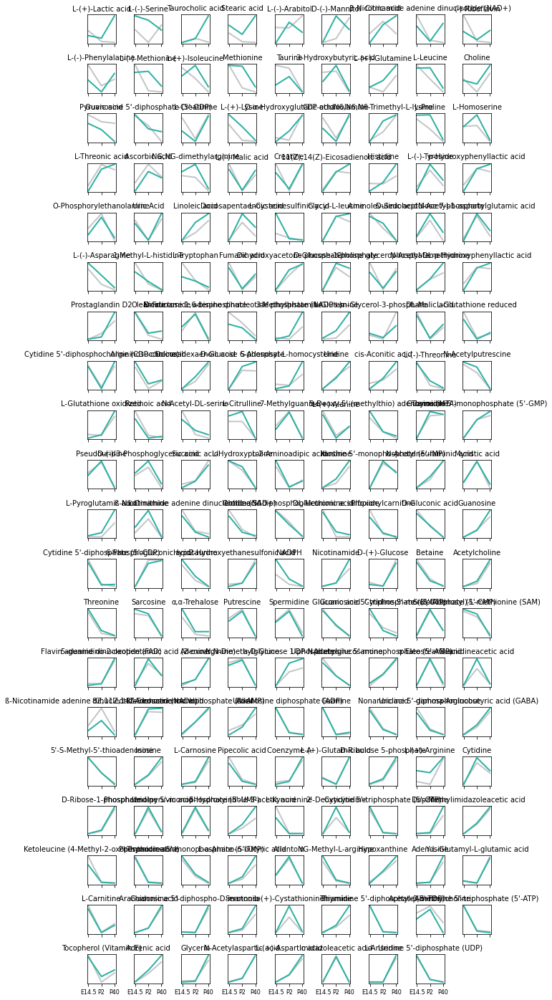

In [30]:
wt_data = metabo.loc[:, wt_data_columns].astype(float).T.groupby([s[4:-1] for s in wt_data_columns]).mean().T
ko_data = metabo.loc[:, ko_data_columns].astype(float).T.groupby([s[4:-1] for s in ko_data_columns]).mean().T

fig, axs = plt.subplots(20, 9, sharex = True)
for i, ax in zip(sort_idx, axs.reshape(180)):
    metabolite = metabo.iloc[i].Name
    ID = metabo.iloc[i].ID
    for condition, color, data in zip(['wt', 'ko'], ['#C4C5C8', '#2CB1A2'], [wt_data, ko_data]):
        # if condition == 'ko':
        #     break
        ax.plot(
            [1, 2, 3],
            data.loc[ID, :].values,
            label = condition,
            lw = 2,
            color = color
        )
        
    ax.set_title(metabolite, fontsize = 10)
    ax.set_xticks([1, 2, 3])
    ax.set_xticklabels(['E14.5', 'P2', 'P40'], fontsize = 8)
    ax.set_yticks([])
        
for ax in axs.reshape(180)[len(metabo):]:
    ax.remove()
    
fig.set_figwidth(8.27)
fig.set_figheight(19.5)
fig.tight_layout()
fig.savefig('../plots/metabolomics_trajectories_raw_values.pdf')

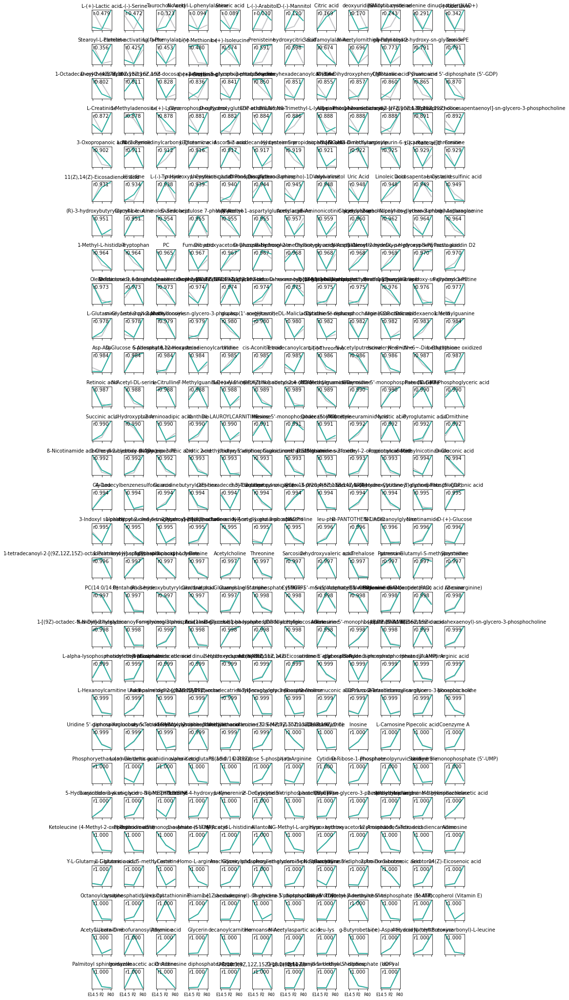

In [31]:
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics.pairwise import cosine_similarity
fig, axs = plt.subplots(29, 12, sharex = True, sharey = True)
correlations = []
base = 'hilic'
df = basedata[base.upper()]
for metabolite in df.index:
    correlations.append(
        pearsonr(
            clustering_results[f'{base}_wt']['data'].loc[metabolite, :].values,
            clustering_results[f'{base}_ko']['data'].loc[metabolite, :].values
        )[0]
    )

tmp = df.copy()
tmp['correlations'] = correlations
tmp.loc[tmp.correlations < 0.975, ['Name', 'KEGG', 'correlations']].to_csv(
    '../results/metabolomics_changed_dynamics.hilicbase.tsv',
    sep = '\t',
    index = False
)

metabolite_list = []
sort_idx = np.argsort(correlations)
for i, ax in zip(sort_idx, axs.reshape(348)):
    metabolite = df.iloc[i].Name
    ID = df.iloc[i].ID
    metabolite_list.append(
        [metabolite, ID, correlations[i]]
    )
    for condition, color in zip(['wt', 'ko'], ['#C4C5C8', '#2CB1A2']):
#         if condition == 'ko':
#             break
            
        ax.plot(
            [1, 2, 3],
            clustering_results[f'{base}_{condition}']['data'].loc[ID, :].values,
            label = condition,
            lw = 2,
            color = color
        )
        
    ax.text(
        1, 1, 
        'r{:.3f}'.format(correlations[i]),
        ha = 'left',
        va = 'top'
    )
        
    ax.set_title(metabolite, fontsize = 10)
    ax.set_xticks([1, 2, 3])
    ax.set_xticklabels(['E14.5', 'P2', 'P40'], fontsize = 8)
    ax.set_yticks([])
        
for ax in axs.reshape(348)[len(df):]:
    ax.remove()
    
fig.set_figwidth(11.03)
fig.set_figheight(28.53)
fig.tight_layout()
fig.savefig('../plots/metabolomics_trajectories_scaled_values.hilicbase.pdf')

In [32]:
df = pd.DataFrame(
    metabolite_list,
    columns = ['name', 'ID', 'pearsonr']
)
df.to_csv(
    '../results/metabolomics_trajectories_scaled_values.hilicbase.metabolites.tsv',
    sep = '\t',
    index = False
)

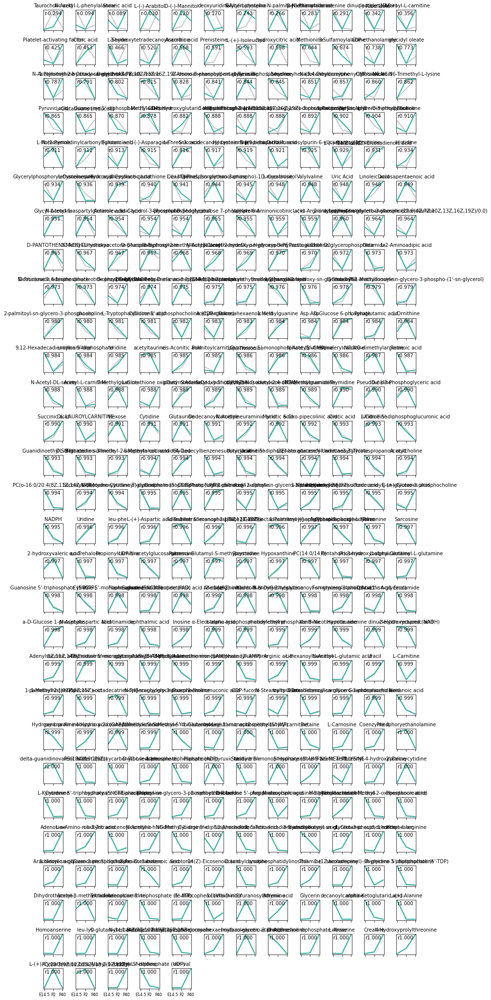

In [33]:
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics.pairwise import cosine_similarity
fig, axs = plt.subplots(29, 12, sharex = True, sharey = True)
correlations = []
base = 'rp'
df = basedata[base.upper()]
for metabolite in df.index:
    correlations.append(
        pearsonr(
            clustering_results[f'{base}_wt']['data'].loc[metabolite, :].values,
            clustering_results[f'{base}_ko']['data'].loc[metabolite, :].values
        )[0]
    )
    
tmp = df.copy()
tmp['correlations'] = correlations
tmp.loc[tmp.correlations < 0.975, ['Name', 'KEGG', 'correlations']].to_csv(
    '../results/metabolomics_changed_dynamics.rpbase.tsv',
    sep = '\t',
    index = False
)

sort_idx = np.argsort(correlations)
for i, ax in zip(sort_idx, axs.reshape(348)):
    metabolite = df.iloc[i].Name
    ID = df.iloc[i].ID
    for condition, color in zip(['wt', 'ko'], ['#C4C5C8', '#2CB1A2']):
#         if condition == 'ko':
#             break
            
        ax.plot(
            [1, 2, 3],
            clustering_results[f'{base}_{condition}']['data'].loc[ID, :].values,
            label = condition,
            lw = 2,
            color = color
        )
    ax.text(
        1, 1, 
        'r{:.3f}'.format(correlations[i]),
        ha = 'left',
        va = 'top'
    )    
    ax.set_title(metabolite, fontsize = 10)
    ax.set_xticks([1, 2, 3])
    ax.set_xticklabels(['E14.5', 'P2', 'P40'], fontsize = 8)
    ax.set_yticks([])
        
for ax in axs.reshape(348)[len(df):]:
    ax.remove()
    
fig.set_figwidth(11.03)
fig.set_figheight(28.53)
fig.tight_layout()
fig.savefig('../plots/metabolomics_trajectories_scaled_values.rpbase.pdf')

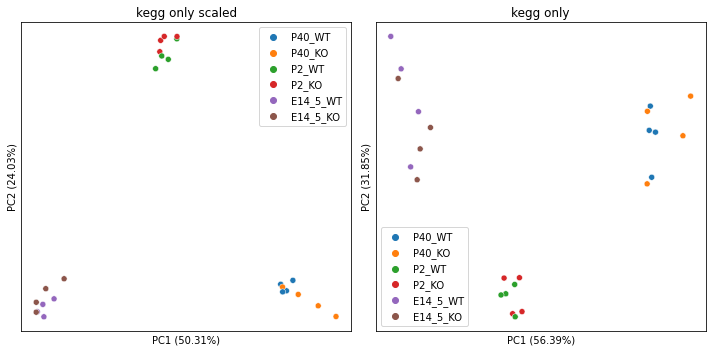

In [34]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components = 2)
scaler = StandardScaler()
fig, axs = plt.subplots(1, 2)
data = metabo.loc[:, metabo.columns[metabo.columns.str.startswith('S')]].T
for scaled, ax in zip([True, False], axs):
    if scaled:
        title = 'kegg only ' + 'scaled'
        transform = pca.fit_transform(
            scaler.fit_transform(data.values)
        )
    else:
        title = 'kegg only'
        transform = pca.fit_transform(
            data.values
        )

    sns.scatterplot(
        x = transform[:, 0],
        y = transform[:, 1],
        hue = [i[4:-1] for i in data.index.to_list()],
        ax = ax
    )

    ax.set_title(title)
    ax.set_ylabel(
        'PC2 ({:.2f}%)'.format(pca.explained_variance_ratio_[1] * 100)
    )
    ax.set_xlabel(
        'PC1 ({:.2f}%)'.format(pca.explained_variance_ratio_[0] * 100)
    )
    ax.set_xticks([])
    ax.set_yticks([])

fig.set_figheight(5)
fig.set_figwidth(10)
fig.tight_layout()
fig.savefig('../plots/metabolomics_pca_kegg_only.pdf')

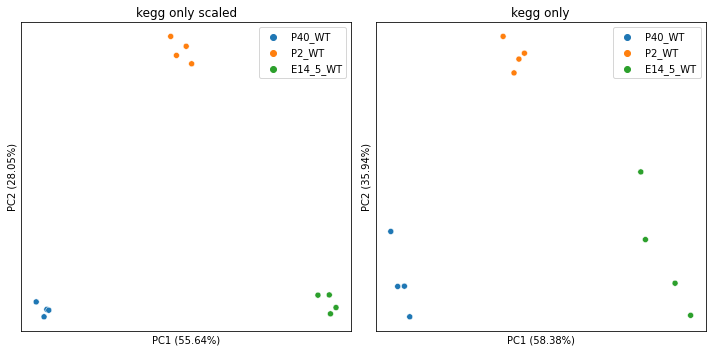

In [35]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components = 2)
scaler = StandardScaler()
fig, axs = plt.subplots(1, 2)
data = metabo.loc[:, metabo.columns[metabo.columns.str.match('S[0-9]{2}_[EP][0-9][_0-9]+WT[0-9]')]].T
for scaled, ax in zip([True, False], axs):
    if scaled:
        title = 'kegg only ' + 'scaled'
        transform = pca.fit_transform(
            scaler.fit_transform(data.values)
        )
    else:
        title = 'kegg only'
        transform = pca.fit_transform(
            data.values
        )

    sns.scatterplot(
        x = transform[:, 0],
        y = transform[:, 1],
        hue = [i[4:-1] for i in data.index.to_list()],
        ax = ax
    )

    ax.set_title(title)
    ax.set_ylabel(
        'PC2 ({:.2f}%)'.format(pca.explained_variance_ratio_[1] * 100)
    )
    ax.set_xlabel(
        'PC1 ({:.2f}%)'.format(pca.explained_variance_ratio_[0] * 100)
    )
    ax.set_xticks([])
    ax.set_yticks([])

fig.set_figheight(5)
fig.set_figwidth(10)
fig.tight_layout()
fig.savefig('../plots/metabolomics_pca_kegg_only_wt_only.pdf')

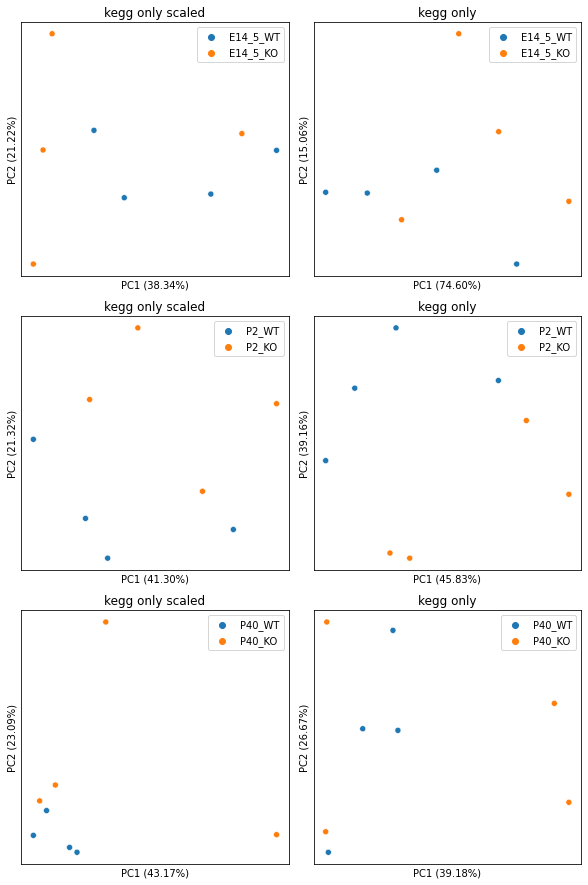

In [36]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components = 2)
scaler = StandardScaler()
fig, axs = plt.subplots(3, 2)
for i, timepoint in enumerate(['E14_5', 'P2', 'P40']):
    data = metabo.loc[:, metabo.columns[metabo.columns.str.match('S[0-9]{2}_' + timepoint + '_[WTKO]{2}[0-9]')]].T
    for scaled, ax in zip([True, False], axs[i, :]):
        if scaled:
            title = 'kegg only ' + 'scaled'
            transform = pca.fit_transform(
                scaler.fit_transform(data.values)
            )
        else:
            title = 'kegg only'
            transform = pca.fit_transform(
                data.values
            )

        sns.scatterplot(
            x = transform[:, 0],
            y = transform[:, 1],
            hue = [i[4:-1] for i in data.index.to_list()],
            ax = ax
        )

        ax.set_title(title)
        ax.set_ylabel(
            'PC2 ({:.2f}%)'.format(pca.explained_variance_ratio_[1] * 100)
        )
        ax.set_xlabel(
            'PC1 ({:.2f}%)'.format(pca.explained_variance_ratio_[0] * 100)
        )
        ax.set_xticks([])
        ax.set_yticks([])

fig.set_figheight(8.27 / 2 * 3)
fig.set_figwidth(8.27)
fig.tight_layout()
fig.savefig('../plots/metabolomics_pca_kegg_only_separate_timepoints.pdf')

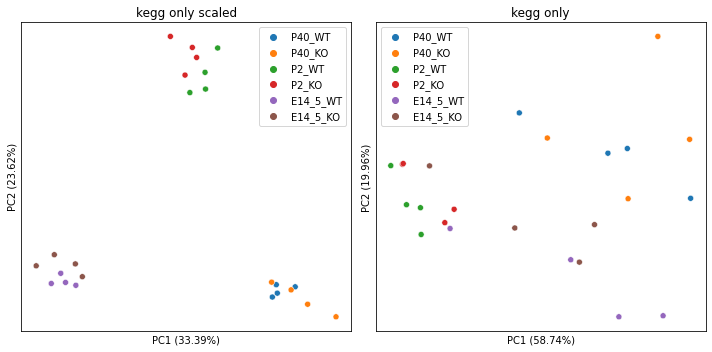

In [37]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

correlations = []
for metabolite in metabo.index:
    correlations.append(
        pearsonr(
            kegg_only_clustering_results['wt']['data'].loc[metabolite, :].values,
            kegg_only_clustering_results['ko']['data'].loc[metabolite, :].values
        )[0]
    )

pca = PCA(n_components = 2)
scaler = StandardScaler()
fig, axs = plt.subplots(1, 2)
data = metabo.loc[np.array(correlations) < 0.975, metabo.columns[metabo.columns.str.startswith('S')]].T
for scaled, ax in zip([True, False], axs):
    if scaled:
        title = 'kegg only ' + 'scaled'
        transform = pca.fit_transform(
            scaler.fit_transform(data.values)
        )
    else:
        title = 'kegg only'
        transform = pca.fit_transform(
            data.values
        )

    sns.scatterplot(
        x = transform[:, 0],
        y = transform[:, 1],
        hue = [i[4:-1] for i in data.index.to_list()],
        ax = ax
    )

    ax.set_title(title)
    ax.set_ylabel(
        'PC2 ({:.2f}%)'.format(pca.explained_variance_ratio_[1] * 100)
    )
    ax.set_xlabel(
        'PC1 ({:.2f}%)'.format(pca.explained_variance_ratio_[0] * 100)
    )
    ax.set_xticks([])
    ax.set_yticks([])

fig.set_figheight(5)
fig.set_figwidth(10)
fig.tight_layout()
fig.savefig('../plots/metabolomics_pca_kegg_only_diff_trajectory_metabolites.pdf')

In [38]:
wt_data = metabo.loc[:, wt_data_columns].astype(float).T.groupby([s[4:-1] for s in wt_data_columns]).mean().T
ko_data = metabo.loc[:, ko_data_columns].astype(float).T.groupby([s[4:-1] for s in ko_data_columns]).mean().T
correlations = []
for metabolite in metabo.index:
    correlations.append(
        pearsonr(
            kegg_only_clustering_results['wt']['data'].loc[metabolite, :].values,
            kegg_only_clustering_results['ko']['data'].loc[metabolite, :].values
        )[0]
    )
    
for key, data in zip(['WT', 'KO'], [wt_data, ko_data]):
    cols = [f'E14_5_{key}', f'P2_{key}', f'P40_{key}']
    for col in cols:
        data[col + '_norm'] = data[col] / data[cols].sum(axis = 1)
    
data = wt_data.loc[:, ['E14_5_WT_norm', 'P2_WT_norm', 'P40_WT_norm']].merge(
    ko_data.loc[:, ['E14_5_KO_norm', 'P2_KO_norm', 'P40_KO_norm']],
    left_index = True, 
    right_index = True,
    how = 'left'
)
data.columns = data.columns.str.replace('_norm', '')
changed_dynamics = data.loc[np.array(correlations) < 0.975, :]
changed_dynamics

,E14_5_WT,P2_WT,P40_WT,E14_5_KO,P2_KO,P40_KO
B086_RP,0.465583,0.283567,0.250850,0.382689,0.377218,0.240093
A062_HILIC,0.448426,0.414328,0.137246,0.380567,0.486625,0.132809
B122_HILIC,0.353071,0.295167,0.351762,0.338603,0.303235,0.358162
A012_HILIC,0.368432,0.244419,0.387149,0.322611,0.254397,0.422992
A028_HILIC,0.576812,0.267073,0.156114,0.517288,0.334131,0.148581
B169_HILIC,0.230312,0.516490,0.253198,0.184582,0.510918,0.304500
B134_HILIC,0.663268,0.274970,0.061761,0.891139,0.072282,0.036579
A035_HILIC,0.309342,0.260037,0.430621,0.253123,0.308589,0.438289
B121_HILIC,0.648893,0.312624,0.038483,0.556438,0.409319,0.034243
A050_HILIC,0.647756,0.233238,0.119006,0.536598,0.322369,0.141033


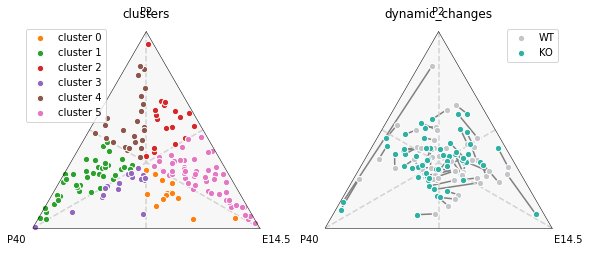

In [39]:
import ternary
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

fig, axs = plt.subplots(1, 2)
tax1 = ternary.TernaryAxesSubplot(ax=axs[0], scale = 1)
data1 = metabo.loc[:, wt_data_columns].astype(float).T.groupby([s[4:-1] for s in wt_data_columns]).mean().T

cols = ['E14_5_WT', 'P2_WT', 'P40_WT']
for col in cols:
    data1[col + 'norm'] = data1[col] / data1[cols].sum(axis = 1)

clusters = kegg_only_clustering_results['wt']['clusters']
for clust in np.unique(clusters):
    tax1.scatter(
        data1.loc[clusters == clust, [c + 'norm' for c in cols]].values,
        zorder = 2,
        edgecolor = 'white',
        s = 40,
        label = f'cluster {clust}'
    )
tax1.legend()
tax2 = ternary.TernaryAxesSubplot(ax=axs[1], scale = 1)
wt_cols = changed_dynamics.columns[changed_dynamics.columns.str.endswith('WT')]
ko_cols = changed_dynamics.columns[changed_dynamics.columns.str.endswith('KO')]
for points, color, label in zip(
    [changed_dynamics[wt_cols], changed_dynamics[ko_cols]], 
    ['#C4C5C8', '#2CB1A2'],
    ['WT', 'KO']
):
    tax2.scatter(
        points.values,
        c = color,
        zorder = 2,
        label = label,
        s = 40,
        edgecolor = 'white'
    )

tax2.legend(loc = 'upper right')
for i, row in changed_dynamics.iterrows():
    wt = row[wt_cols].values
    ko = row[ko_cols].values
    tax2.line(
        wt, ko, c = 'grey', zorder = 1
    )

for tax, title in zip([tax1, tax2], ['clusters', 'dynamic_changes']):
    # plot apparent cluster boundaries
    mid = [1/3] * 3
    for p in [
        [1, 0, 0], [0, 1, 0], [0, 0, 1], 
        [0.5, 0.5, 0], [0, 0.5, 0.5], [0.5, 0, 0.5]
    ]:
        tax.line(
            p, mid, ls = '--', c = 'lightgrey', zorder = 1
        )
    
    tax.set_title(title)
    tax.top_corner_label('P2')
    tax.left_corner_label('P40')
    tax.right_corner_label('E14.5')
    tax.get_axes().axis('off')  
    tax.boundary(lw = 0.5)
    tax.get_axes().set_aspect(1)
    tax._redraw_labels()
    
fig.set_figheight(8.27 / 2)
fig.set_figwidth(8.27)
fig.tight_layout()
fig.savefig('../plots/metabolomics_dynamics_summary.pdf')

## Enrichments
### Custom groups

In [40]:
from statsmodels.stats.multitest import fdrcorrection
# the following cells are a simple implementation of a pathway enrichment analysis
# based on differential abundance of compounds using Fisher's exact test
def compute_overlaps(diff_compounds, pathways, metabolites = None):
    '''
    computes overlaps between differentially regulated compounds and 
    each set of pathway compounds. Pathway compounds are limited to
    the set of compounds given by metabolites (i.e. adjustment to background
    aka only quantified metabolites are considered)
    '''
    diff_compounds = set(diff_compounds)
    overlaps = []
    for key, pathway in pathways.items():
        if 'COMPOUND' in pathway:
            pathway_metabolites = set(pathway['COMPOUND'].keys())
            if metabolites:
                pathway_metabolites = pathway_metabolites.intersection(
                    set(metabolites)
                )
            olap = len(
                diff_compounds.intersection(
                    pathway_metabolites
                )
            )
            if olap:
                overlaps.append(
                    [
                        key, 
                        pathway['NAME'][0],
                        len(
                            diff_compounds.intersection(
                                pathway_metabolites
                            )
                        ),
                        len(pathway_metabolites),
                        list(pathway_metabolites)
                    ]
                )
    
    return pd.DataFrame(overlaps, columns = ['mapid', 'name', 'ncommon', 'ncompounds', 'compounds'])

# pvalue computation based on hypergeometric distribution
from scipy.stats import hypergeom
import numpy as np
def pvalue(k, M, n, N):
    """
    computes the probability to find k or more overlapping genes between two gene sets
    of n and N genes, where n is the number of genes in the gene set to which we overlap
    (i.e. number of genes in a pathway or number of differentially expressed genes in
    another patient) and N is the number of genes in the gene set which we are interested
    in (i.e. number of differentially expressed genes) which are drawn from M total genes
    (i.e. number of genes considered during differential expression analysis). This is also
    known as computing the pvalue for fisher's exact test.
    See http://www.pathwaycommons.org/guide/primers/statistics/fishers_exact_test/ for
    more information on how this is computed
    :param k:   number of common genes between two gene sets
    :param M:   total number of genes considered during DEA
    :param n:   number of genes in gene set with which we overlap
    :param N:   number of differentially expressed genes
    :return:    probability to find k or more common genes between the two gene sets
    """
    # k - 1 because we are computing P(x >= k) which includes k
    pval = hypergeom.sf(
        k - 1, M, n, N
    )
    return pval

In [41]:
# generating pseudo pathways in a way that matches the expected data for computing overlaps
pseudo_pathways = {}
for base in ['HILIC', 'RP']:
    pseudo_pathways[base] = {}
    for name, groupdf in basedata[base].groupby('metabolitegroupcoarse'):
        pathway = {
            'NAME': [name, ''],
            'COMPOUND': {
                row['ID'].upper(): row['Name'] for i, row in groupdf.iterrows()
            }
        }
        
        pseudo_pathways[base][name] = pathway

In [42]:
enrich_results = {}
for base in ['hilic', 'rp']:
    for genotype in ['wt', 'ko']:
        data, clusters = [clustering_results[f'{base}_{genotype}'][k] for k in ['data', 'clusters']]
        data = data.copy()
        data['cluster'] = clusters
        frames = []
        for cluster, clusterdf in data.groupby('cluster'):
            enriched = compute_overlaps(
                clusterdf.index.to_list(),
                pseudo_pathways[base.upper()]
            )
            enriched['pvalue'] = enriched.apply(
                lambda x: pvalue(x.ncommon, len(data), x.ncompounds, len(clusterdf)),
                axis = 1
            )
            
            for values, col in zip(
                fdrcorrection(enriched.pvalue, method = 'indep'),
                ['reject', 'padj']
            ):
                enriched[col] = values
            enriched.sort_values(
                by = 'pvalue',
                inplace = True
            )
            enriched['cluster'] = cluster
            frames.append(enriched)
        
        df = pd.concat(frames)
        enrich_results[f'{base}_{genotype}'] = df
        df.to_csv(
            f'../results/custom_metabolomics_{base}_{genotype}.clusterenrich.tsv',
            index = False,
            sep = '\t'
        )

In [43]:
enrich_results['hilic_wt']

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj,cluster
3,lipid metablism,lipid metablism,16,93,"[C327_HILIC, B154_HILIC, C310_HILIC, B129_HILI...",0.030264,False,0.181583,0
1,bioenergetic process,bioenergetic process,4,23,"[A084_HILIC, B124_HILIC, A114_HILIC, A019_HILI...",0.252398,False,0.757194,0
2,glycolysis,glycolysis,1,14,"[C223_HILIC, A004_HILIC, A059_HILIC, A054_RP, ...",0.818888,False,0.997317,0
5,other,other,5,62,"[A097_HILIC, C261_HILIC, C249_HILIC, A076_HILI...",0.867432,False,0.997317,0
0,aa metabolism,aa metabolism,9,108,"[B125_HILIC, A066_HILIC, A028_HILIC, C233_HILI...",0.914040,False,0.997317,0
4,nucleoside metabolism,nucleoside metabolism,1,46,"[C299_HILIC, A031_HILIC, A011_HILIC, C307_HILI...",0.997317,False,0.997317,0
4,nucleoside metabolism,nucleoside metabolism,15,46,"[C299_HILIC, A031_HILIC, A011_HILIC, C307_HILI...",0.092627,False,0.319088,1
5,other,other,19,62,"[A097_HILIC, C261_HILIC, C249_HILIC, A076_HILI...",0.106363,False,0.319088,1
2,glycolysis,glycolysis,4,14,"[C223_HILIC, A004_HILIC, A059_HILIC, A054_RP, ...",0.432939,False,0.865879,1
1,bioenergetic process,bioenergetic process,5,23,"[A084_HILIC, B124_HILIC, A114_HILIC, A019_HILI...",0.673588,False,0.916555,1


In [44]:
enrich_results['hilic_ko']

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj,cluster
1,bioenergetic process,bioenergetic process,4,23,"[A084_HILIC, B124_HILIC, A114_HILIC, A019_HILI...",0.283966,False,0.853025,0
3,lipid metablism,lipid metablism,13,93,"[C327_HILIC, B154_HILIC, C310_HILIC, B129_HILI...",0.284342,False,0.853025,0
5,other,other,7,62,"[A097_HILIC, C261_HILIC, C249_HILIC, A076_HILI...",0.631089,False,0.942186,0
2,glycolysis,glycolysis,1,14,"[C223_HILIC, A004_HILIC, A059_HILIC, A054_RP, ...",0.835055,False,0.942186,0
4,nucleoside metabolism,nucleoside metabolism,3,46,"[C299_HILIC, A031_HILIC, A011_HILIC, C307_HILI...",0.935525,False,0.942186,0
0,aa metabolism,aa metabolism,9,108,"[B125_HILIC, A066_HILIC, A028_HILIC, C233_HILI...",0.942186,False,0.942186,0
5,other,other,22,62,"[A097_HILIC, C261_HILIC, C249_HILIC, A076_HILI...",0.238357,False,0.508036,1
2,glycolysis,glycolysis,6,14,"[C223_HILIC, A004_HILIC, A059_HILIC, A054_RP, ...",0.239524,False,0.508036,1
1,bioenergetic process,bioenergetic process,9,23,"[A084_HILIC, B124_HILIC, A114_HILIC, A019_HILI...",0.254018,False,0.508036,1
4,nucleoside metabolism,nucleoside metabolism,15,46,"[C299_HILIC, A031_HILIC, A011_HILIC, C307_HILI...",0.456227,False,0.684341,1


In [45]:
enrich_results['rp_wt']

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj,cluster
5,other,other,19,60,"[A097_HILIC, A003_RP, C261_HILIC, A032_RP, C24...",0.111157,False,0.431255,1
4,nucleoside metabolism,nucleoside metabolism,15,47,"[A011_HILIC, C307_HILIC, A023_RP, C284_HILIC, ...",0.143752,False,0.431255,1
2,glycolysis,glycolysis,4,14,"[C223_HILIC, A059_HILIC, A054_RP, A001_HILIC, ...",0.466781,False,0.702363,1
1,bioenergetic process,bioenergetic process,6,22,"[A061_RP, A114_HILIC, A072_RP, A102_HILIC, B10...",0.468242,False,0.702363,1
0,aa metabolism,aa metabolism,20,107,"[B125_HILIC, A058_RP, C233_HILIC, A029_RP, C16...",0.970170,False,0.977546,1
3,lipid metablism,lipid metablism,16,91,"[C327_HILIC, B129_HILIC, C158_RP, C136_RP, B17...",0.977546,False,0.977546,1
5,other,other,8,60,"[A097_HILIC, A003_RP, C261_HILIC, A032_RP, C24...",0.344501,False,0.932000,2
0,aa metabolism,aa metabolism,13,107,"[B125_HILIC, A058_RP, C233_HILIC, A029_RP, C16...",0.408821,False,0.932000,2
2,glycolysis,glycolysis,2,14,"[C223_HILIC, A059_HILIC, A054_RP, A001_HILIC, ...",0.476215,False,0.932000,2
3,lipid metablism,lipid metablism,9,91,"[C327_HILIC, B129_HILIC, C158_RP, C136_RP, B17...",0.733409,False,0.932000,2


In [46]:
enrich_results['rp_ko']

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj,cluster
3,lipid metablism,lipid metablism,13,91,"[C327_HILIC, B129_HILIC, C158_RP, C136_RP, B17...",0.178259,False,0.953600,0
5,other,other,7,60,"[A097_HILIC, A003_RP, C261_HILIC, A032_RP, C24...",0.518062,False,0.953600,0
1,bioenergetic process,bioenergetic process,2,22,"[A061_RP, A114_HILIC, A072_RP, A102_HILIC, B10...",0.730411,False,0.953600,0
2,glycolysis,glycolysis,1,14,"[C223_HILIC, A059_HILIC, A054_RP, A001_HILIC, ...",0.815210,False,0.953600,0
4,nucleoside metabolism,nucleoside metabolism,3,47,"[A011_HILIC, C307_HILIC, A023_RP, C284_HILIC, ...",0.922996,False,0.953600,0
0,aa metabolism,aa metabolism,8,107,"[B125_HILIC, A058_RP, C233_HILIC, A029_RP, C16...",0.953600,False,0.953600,0
5,other,other,22,60,"[A097_HILIC, A003_RP, C261_HILIC, A032_RP, C24...",0.189891,False,0.487534,1
1,bioenergetic process,bioenergetic process,9,22,"[A061_RP, A114_HILIC, A072_RP, A102_HILIC, B10...",0.211691,False,0.487534,1
2,glycolysis,glycolysis,6,14,"[C223_HILIC, A059_HILIC, A054_RP, A001_HILIC, ...",0.243767,False,0.487534,1
4,nucleoside metabolism,nucleoside metabolism,16,47,"[A011_HILIC, C307_HILIC, A023_RP, C284_HILIC, ...",0.376047,False,0.564071,1


In [47]:
enrich_results = {}
pval_threshold = 0.05
abs_lfc_threshold = 1
for base in ['hilic', 'rp']:
    data = basedata[base.upper()]
    for genotype, contrasts in zip(
        ['wt', 'ko'],
        [
            ['(P2, WT) / (E14_5, WT)', '(P40, WT) / (P2, WT)', '(P40, WT) / (E14_5, WT)'],
            ['(P2, KO) / (E14_5, KO)', '(P40, KO) / (P2, KO)', '(P40, KO) / (E14_5, KO)']
        ]
    ):
        frames = []
        for contrast in contrasts:
            for direction, idx in zip(
                ['up', 'down'],
                [
                    data[contrast].astype(float) >= abs_lfc_threshold,
                    data[contrast].astype(float) <= abs_lfc_threshold
                ]
            ):
                hue_idx = idx & (data[contrast + '.1'].astype(float) < pval_threshold)
                
                enriched = compute_overlaps(
                    data[hue_idx].ID.to_list(),
                    pseudo_pathways[base.upper()]
                )
                enriched['pvalue'] = enriched.apply(
                    lambda x: pvalue(x.ncommon, len(data), x.ncompounds, len(data[hue_idx])),
                    axis = 1
                )

                for values, col in zip(
                    fdrcorrection(enriched.pvalue, method = 'indep'),
                    ['reject', 'padj']
                ):
                    enriched[col] = values
                    
                enriched.sort_values(
                    by = 'pvalue',
                    inplace = True
                )
                
                enriched['contrast'] = contrast
                enriched['regulation'] = direction
                
                frames.append(enriched)
        
        df = pd.concat(frames)
        enrich_results[f'{base}_{genotype}'] = df
        df.to_csv(
            f'../results/custom_metabolomics_{base}_{genotype}.groupenrich.tsv',
            index = False,
            sep = '\t'
        )

In [48]:
enrich_results['hilic_wt']

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj,contrast,regulation
1,glycolysis,glycolysis,6,14,"[C223_HILIC, A004_HILIC, A059_HILIC, A054_RP, ...",0.017376,False,0.086880,"(P2, WT) / (E14_5, WT)",up
3,nucleoside metabolism,nucleoside metabolism,12,46,"[C299_HILIC, A031_HILIC, A011_HILIC, C307_HILI...",0.058873,False,0.147182,"(P2, WT) / (E14_5, WT)",up
4,other,other,13,62,"[A097_HILIC, C261_HILIC, C249_HILIC, A076_HILI...",0.211636,False,0.352727,"(P2, WT) / (E14_5, WT)",up
2,lipid metablism,lipid metablism,13,93,"[C327_HILIC, B154_HILIC, C310_HILIC, B129_HILI...",0.842156,False,0.992730,"(P2, WT) / (E14_5, WT)",up
0,aa metabolism,aa metabolism,11,108,"[B125_HILIC, A066_HILIC, A028_HILIC, C233_HILI...",0.992730,False,0.992730,"(P2, WT) / (E14_5, WT)",up
1,bioenergetic process,bioenergetic process,11,23,"[A084_HILIC, B124_HILIC, A114_HILIC, A019_HILI...",0.257262,False,0.999228,"(P2, WT) / (E14_5, WT)",down
0,aa metabolism,aa metabolism,44,108,"[B125_HILIC, A066_HILIC, A028_HILIC, C233_HILI...",0.400480,False,0.999228,"(P2, WT) / (E14_5, WT)",down
3,lipid metablism,lipid metablism,36,93,"[C327_HILIC, B154_HILIC, C310_HILIC, B129_HILI...",0.601769,False,0.999228,"(P2, WT) / (E14_5, WT)",down
4,nucleoside metabolism,nucleoside metabolism,17,46,"[C299_HILIC, A031_HILIC, A011_HILIC, C307_HILI...",0.693423,False,0.999228,"(P2, WT) / (E14_5, WT)",down
5,other,other,21,62,"[A097_HILIC, C261_HILIC, C249_HILIC, A076_HILI...",0.867038,False,0.999228,"(P2, WT) / (E14_5, WT)",down


In [49]:
enrich_results['hilic_ko']

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj,contrast,regulation
2,glycolysis,glycolysis,7,14,"[C223_HILIC, A004_HILIC, A059_HILIC, A054_RP, ...",0.018567,False,0.077905,"(P2, KO) / (E14_5, KO)",up
4,nucleoside metabolism,nucleoside metabolism,16,46,"[C299_HILIC, A031_HILIC, A011_HILIC, C307_HILI...",0.025968,False,0.077905,"(P2, KO) / (E14_5, KO)",up
5,other,other,19,62,"[A097_HILIC, C261_HILIC, C249_HILIC, A076_HILI...",0.059369,False,0.118739,"(P2, KO) / (E14_5, KO)",up
3,lipid metablism,lipid metablism,17,93,"[C327_HILIC, B154_HILIC, C310_HILIC, B129_HILI...",0.890786,False,0.998832,"(P2, KO) / (E14_5, KO)",up
1,bioenergetic process,bioenergetic process,1,23,"[A084_HILIC, B124_HILIC, A114_HILIC, A019_HILI...",0.997546,False,0.998832,"(P2, KO) / (E14_5, KO)",up
0,aa metabolism,aa metabolism,14,108,"[B125_HILIC, A066_HILIC, A028_HILIC, C233_HILI...",0.998832,False,0.998832,"(P2, KO) / (E14_5, KO)",up
0,aa metabolism,aa metabolism,37,108,"[B125_HILIC, A066_HILIC, A028_HILIC, C233_HILI...",0.241592,False,0.793033,"(P2, KO) / (E14_5, KO)",down
1,bioenergetic process,bioenergetic process,9,23,"[A084_HILIC, B124_HILIC, A114_HILIC, A019_HILI...",0.264344,False,0.793033,"(P2, KO) / (E14_5, KO)",down
3,lipid metablism,lipid metablism,27,93,"[C327_HILIC, B154_HILIC, C310_HILIC, B129_HILI...",0.744490,False,0.995307,"(P2, KO) / (E14_5, KO)",down
4,nucleoside metabolism,nucleoside metabolism,12,46,"[C299_HILIC, A031_HILIC, A011_HILIC, C307_HILI...",0.835494,False,0.995307,"(P2, KO) / (E14_5, KO)",down


In [50]:
enrich_results['rp_wt']

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj,contrast,regulation
4,nucleoside metabolism,nucleoside metabolism,16,47,"[A011_HILIC, C307_HILIC, A023_RP, C284_HILIC, ...",0.004469,True,0.026816,"(P2, WT) / (E14_5, WT)",up
2,glycolysis,glycolysis,6,14,"[C223_HILIC, A059_HILIC, A054_RP, A001_HILIC, ...",0.027848,False,0.083543,"(P2, WT) / (E14_5, WT)",up
5,other,other,13,60,"[A097_HILIC, A003_RP, C261_HILIC, A032_RP, C24...",0.295856,False,0.591712,"(P2, WT) / (E14_5, WT)",up
3,lipid metablism,lipid metablism,13,91,"[C327_HILIC, B129_HILIC, C158_RP, C136_RP, B17...",0.915629,False,0.998148,"(P2, WT) / (E14_5, WT)",up
1,bioenergetic process,bioenergetic process,1,22,"[A061_RP, A114_HILIC, A072_RP, A102_HILIC, B10...",0.990485,False,0.998148,"(P2, WT) / (E14_5, WT)",up
0,aa metabolism,aa metabolism,11,107,"[B125_HILIC, A058_RP, C233_HILIC, A029_RP, C16...",0.998148,False,0.998148,"(P2, WT) / (E14_5, WT)",up
0,aa metabolism,aa metabolism,42,107,"[B125_HILIC, A058_RP, C233_HILIC, A029_RP, C16...",0.239512,False,0.998370,"(P2, WT) / (E14_5, WT)",down
3,lipid metablism,lipid metablism,34,91,"[C327_HILIC, B129_HILIC, C158_RP, C136_RP, B17...",0.429510,False,0.998370,"(P2, WT) / (E14_5, WT)",down
1,bioenergetic process,bioenergetic process,7,22,"[A061_RP, A114_HILIC, A072_RP, A102_HILIC, B10...",0.741021,False,0.998370,"(P2, WT) / (E14_5, WT)",down
4,nucleoside metabolism,nucleoside metabolism,14,47,"[A011_HILIC, C307_HILIC, A023_RP, C284_HILIC, ...",0.871460,False,0.998370,"(P2, WT) / (E14_5, WT)",down


In [51]:
enrich_results['rp_ko']

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj,contrast,regulation
4,nucleoside metabolism,nucleoside metabolism,18,47,"[A011_HILIC, C307_HILIC, A023_RP, C284_HILIC, ...",0.010287,False,0.061721,"(P2, KO) / (E14_5, KO)",up
2,glycolysis,glycolysis,7,14,"[C223_HILIC, A059_HILIC, A054_RP, A001_HILIC, ...",0.024865,False,0.074595,"(P2, KO) / (E14_5, KO)",up
5,other,other,19,60,"[A097_HILIC, A003_RP, C261_HILIC, A032_RP, C24...",0.071362,False,0.142725,"(P2, KO) / (E14_5, KO)",up
1,bioenergetic process,bioenergetic process,3,22,"[A061_RP, A114_HILIC, A072_RP, A102_HILIC, B10...",0.924717,False,0.998722,"(P2, KO) / (E14_5, KO)",up
3,lipid metablism,lipid metablism,15,91,"[C327_HILIC, B129_HILIC, C158_RP, C136_RP, B17...",0.978447,False,0.998722,"(P2, KO) / (E14_5, KO)",up
0,aa metabolism,aa metabolism,15,107,"[B125_HILIC, A058_RP, C233_HILIC, A029_RP, C16...",0.998722,False,0.998722,"(P2, KO) / (E14_5, KO)",up
0,aa metabolism,aa metabolism,37,107,"[B125_HILIC, A058_RP, C233_HILIC, A029_RP, C16...",0.095288,False,0.571728,"(P2, KO) / (E14_5, KO)",down
3,lipid metablism,lipid metablism,25,91,"[C327_HILIC, B129_HILIC, C158_RP, C136_RP, B17...",0.719685,False,0.993082,"(P2, KO) / (E14_5, KO)",down
1,bioenergetic process,bioenergetic process,5,22,"[A061_RP, A114_HILIC, A072_RP, A102_HILIC, B10...",0.826781,False,0.993082,"(P2, KO) / (E14_5, KO)",down
4,nucleoside metabolism,nucleoside metabolism,11,47,"[A011_HILIC, C307_HILIC, A023_RP, C284_HILIC, ...",0.872619,False,0.993082,"(P2, KO) / (E14_5, KO)",down


### KEGG pathway enrichment analysis
#### Enrichment on metabolites with differing dynamics in KO and

In [52]:
# load pickled results from above cell
import pickle
with open('../raw/kegg_pathway_maps.pickle', 'rb') as handle:
    pathwaymaps = pickle.load(handle)

In [53]:
# select pathways that either are a metabolism or process information
def select_maps(pathwaydict, class_contains):
    selection = {}
    for k, v in pathwaydict.items():
        if 'CLASS' in v and any([pattern in v['CLASS'][0].lower() for pattern in class_contains]):
            selection[k] = v
            
    return selection

selected_pathways = select_maps(
    pathwaymaps,
    ['metabolism', 'information processing']
)

In [54]:
from statsmodels.stats.multitest import fdrcorrection
from scipy.stats import pearsonr
correlations = []
for metabolite in metabo.index:
    correlations.append(
        pearsonr(
            kegg_only_clustering_results['wt']['data'].loc[metabolite, :].values,
            kegg_only_clustering_results['ko']['data'].loc[metabolite, :].values
        )[0]
    )
    
altered_over_time = metabo.loc[np.array(correlations) < 0.975, 'KEGG'].to_list()

enriched = compute_overlaps(
    altered_over_time,
    selected_pathways,
    metabo.KEGG.to_list()
)
enriched['pvalue'] = enriched.apply(
    lambda x: pvalue(x.ncommon, 179, x.ncompounds, len(altered_over_time)),
    axis = 1
)
for values, col in zip(
    fdrcorrection(enriched.pvalue, method = 'indep'),
    ['reject', 'padj']
):
    enriched[col] = values
enriched.sort_values(
    by = 'pvalue',
    inplace = True
)
enriched.to_csv(
    '../results/metabolomics_diff_dynamics_kegg_enrichment.tsv', 
    sep = '\t', 
    index = False
)
enriched

,mapid,name,ncommon,ncompounds,compounds,pvalue,reject,padj
55,mmu00970,Aminoacyl-tRNA biosynthesis - Mus musculus (mo...,12,17,"[C00152, C00188, C00049, C00041, C00148, C0004...",0.000812,False,0.054414
36,mmu00564,Glycerophospholipid metabolism - Mus musculus ...,6,9,"[C00307, C00093, C00570, C00065, C00114, C0199...",0.033227,False,0.632954
25,mmu00400,"Phenylalanine, tyrosine and tryptophan biosynt...",4,5,"[C00079, C00082, C00074, C00354, C00078]",0.038632,False,0.632954
42,mmu00630,Glyoxylate and dicarboxylate metabolism - Mus ...,5,8,"[C00042, C00417, C00149, C00065, C00064, C0002...",0.074051,False,0.632954
0,mmu00010,Glycolysis / Gluconeogenesis - Mus musculus (m...,4,6,"[C00031, C00186, C00074, C00103, C00111, C00022]",0.087550,False,0.632954
...,...,...,...,...,...,...,...,...
32,mmu00520,Amino sugar and nucleotide sugar metabolism - ...,1,6,"[C00031, C00029, C00096, C00167, C00043, C00103]",0.908443,False,0.966122
11,mmu00220,Arginine biosynthesis - Mus musculus (mouse),1,7,"[C00327, C00049, C03406, C00064, C00077, C0002...",0.939138,False,0.968035
26,mmu00410,beta-Alanine metabolism - Mus musculus (mouse),1,7,"[C00106, C01262, C00049, C00135, C00334, C0031...",0.939138,False,0.968035
12,mmu00230,Purine metabolism - Mus musculus (mouse),3,18,"[C00620, C00130, C00294, C00020, C00044, C0024...",0.968114,False,0.982782


#### Enrichment analysis of deregulated metabolites between timepoints

/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/users/daniel.malzl/.conda/envs/nova/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a l

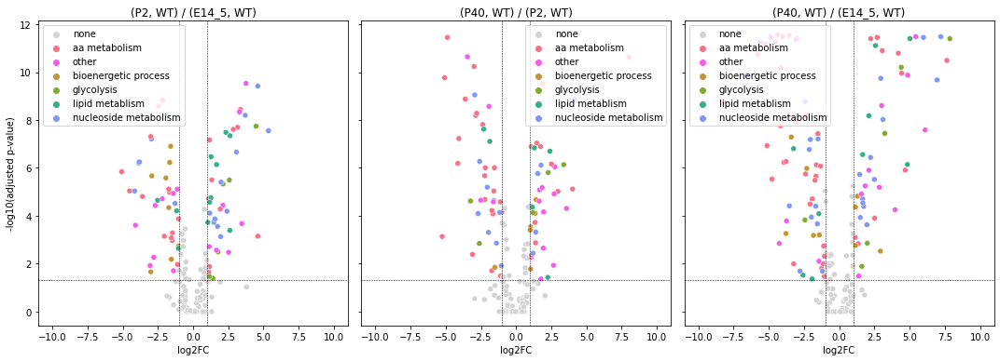

In [55]:
import numpy as np
from adjustText import adjust_text
import seaborn as sns
fig, axs = plt.subplots(1, 3, sharey = True)
data = pd.concat([hilic, no_kegg_hilic])
data_key = 'KEGG_only'
pval_threshold = 0.05
abs_lfc_threshold = 1
deregulated_with = set()
deregulated_without = set()
contrasts = ['(P2, WT) / (E14_5, WT)', '(P40, WT) / (P2, WT)', '(P40, WT) / (E14_5, WT)']
key = 'WT'
data = metabo.copy()
enrichment_results = {}
annotate = False
for contrast, ax in zip(contrasts, axs):
    hue_idx = (np.abs(data[contrast].astype(float)) >= abs_lfc_threshold) & \
        (data[contrast + '.1'].astype(float) < pval_threshold)
    
    enrichment_results[contrast] = {}
    for key, idx in zip(
        ['down', 'up', 'dereg'],
        [
            (data[contrast].astype(float) <= -abs_lfc_threshold) & (data[contrast + '.1'].astype(float) < pval_threshold),
            (data[contrast].astype(float) >= abs_lfc_threshold) & (data[contrast + '.1'].astype(float) < pval_threshold),
            hue_idx
        ]
    ):
        kegg_ids = metabo.loc[idx, 'KEGG'].to_list()
        enriched = compute_overlaps(
            kegg_ids,
            selected_pathways,
            metabo.KEGG.to_list()
        )
        enriched['pvalue'] = enriched.apply(
            lambda x: pvalue(x.ncommon, 179, x.ncompounds, len(kegg_ids)),
            axis = 1
        )
        for values, col in zip(
            fdrcorrection(enriched.pvalue, method = 'indep'),
            ['reject', 'padj']
        ):
            enriched[col] = values
            
        enriched.sort_values(
            by = 'pvalue',
            inplace = True
        )
        enrichment_results[contrast][key] = enriched

    hue_map = [s.metabolitegroupcoarse if sig else 'none' for (i, s), sig in zip(data.iterrows(), hue_idx)]
    palette_dict = {
        k: sns.color_palette('husl', len(np.unique(hue_map)))[i] for i, k in enumerate(np.unique(hue_map))
    }
    palette_dict['none'] = 'lightgrey'
    sns.scatterplot(
        x = data[contrast].astype(float),
        y = -np.log10(data[contrast + '.1'].astype(float)),
        ax = ax,
        hue = [s.metabolitegroupcoarse if sig else 'none' for (i, s), sig in zip(data.iterrows(), hue_idx)],
        palette = palette_dict
    )
    deregulated_with.update(
        data.loc[hue_idx, 'Name'].to_list()
    )
    if not contrast == '(P40, WT) / (E14_5, WT)':
        deregulated_without.update(
            data.loc[hue_idx, 'Name'].to_list()
        )
    # sort metabolites by adjusted pvalue
    if annotate:
        metabolites = highlights[highlights.data_type == data_key].metabolites.str.strip().values
        padj = data.loc[data.Name.isin(metabolites)].drop_duplicates(
            subset = 'Name',
            keep = 'first'
        )
        padj['logpadj'] = -np.log10(padj[contrast + '.1'].astype(float))
        padj['lfc'] = padj[contrast].astype(float)
        padj = padj.sort_values(
            by = 'logpadj'
        ).reset_index()

        for i, row in padj.iterrows():
            x = row['lfc']
            y = row['logpadj']
            ax.annotate(
                row.Name,
                xy = (x, y), 
                xycoords = 'data',
                xytext = (0 if x < 0 else 1, i * 1 / (highlights.data_type == data_key).sum()), 
                textcoords = 'axes fraction',
                arrowprops = dict(arrowstyle = '-', color = 'grey'),
                ha = 'left' if x < 0 else 'right',
                va = 'bottom',
                bbox = dict(boxstyle="round", facecolor = 'white')
            )

    for x in [
        -abs_lfc_threshold, 
        abs_lfc_threshold
    ]:
        ax.axvline(
            x = x,
            ls = '--',
            lw = 0.5,
            c = 'k'
        )

    ax.set_xlabel('log2FC')
    ax.set_ylabel('-log10(adjusted p-value)')

    ax.axhline(
        y = -np.log10(pval_threshold),
        ls = '--',
        lw = 0.5,
        c = 'k'
    )
    ax.set_xlim(-11, 11)
    ax.set_title(contrast)

fig.set_figwidth(15)
fig.set_figheight(5.5)
fig.tight_layout()
fig.savefig('../plots/metabolomics_vulcano_kegg_only.pdf')

#### Enrichment on metabolite groupings based on dynamics

In [56]:
enrichment_results = {}
df = metabo.copy()
for key in ['wt', 'ko']:
    clusters = kegg_only_clustering_results[key]['clusters']
    results = {}
    for c in np.unique(clusters):
        kegg_list = metabo.loc[clusters == c, 'KEGG'].to_list()
        overlaps = compute_overlaps(
            kegg_list,
            selected_pathways,
            metabo.KEGG.to_list()
        )
        overlaps['pvalue'] = overlaps.apply(
            lambda x: pvalue(x.ncommon, 179, x.ncompounds, len(kegg_list)),
            axis = 1
        )
        for values, col in zip(
            fdrcorrection(overlaps.pvalue, method = 'indep'),
            ['reject', 'padj']
        ):
            overlaps[col] = values
            
        overlaps.sort_values(
            by = 'pvalue',
            inplace = True
        )
        overlaps.to_csv(
            f'../results/metabolomics_dynamics_groupings_kegg_enrichment_group{c}_{key}.tsv',
            sep = '\t',
            index = False
        )
        results[c] = overlaps
    
    enrichment_results[key] = results
    df[f'dynamics_group_{key}'] = clusters
    
df[['Name', 'KEGG', 'dynamics_group_wt', 'dynamics_group_ko']].to_csv(
    '../results/metabolomic_metabolites_grouped.tsv',
    sep = '\t',
    index = False
)